# 1. Declare Libraries

In [1]:
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns

# 2. Import Dataset

In [2]:
# Import PBMZI dataset
PBMZI = pd.read_excel('/content/merged4_removed13_data.xlsx',sheet_name=1,skiprows=2)

In [3]:
len(PBMZI.columns)

29

In [4]:
PBMZI["Date"] = pd.to_datetime(PBMZI["Date"])
PBMZI["Date"].dtype

dtype('<M8[ns]')

In [5]:
PBMZI["Date"].dtype
PBMZI.tail()

,Date,AFFIN,ABMB,AMBANK,BIMB,BIPORT,BURSA,CDB,CIMB,DNEX,...,MBSB,MNRB,PBBANK,RANHILL,RHBBANK,SIMEPROP,TAKAFUL,TM,TENAGA,WASCO
1766,2024-10-08,2.88,4.35,5.04,2.69,6.30,9.46,3.58,7.96,0.385,...,0.770,2.37,4.57,1.28,6.20,1.49,3.86,6.52,14.18,1.13
1767,2024-10-09,2.87,4.35,5.02,2.67,6.30,9.45,3.53,8.03,0.380,...,0.760,2.32,4.57,1.27,6.20,1.48,3.88,6.55,14.42,1.11
1768,2024-10-10,2.87,4.35,5.01,2.71,6.20,9.60,3.59,8.08,0.380,...,0.765,2.19,4.57,1.29,6.22,1.48,3.89,6.56,14.38,1.09
1769,2024-10-11,2.87,4.35,5.20,2.70,6.20,9.68,3.56,8.22,0.375,...,0.760,2.10,4.31,1.29,6.25,1.49,3.88,6.55,14.46,1.10
1770,2024-10-14,2.91,4.48,5.19,2.70,6.15,9.60,3.61,8.25,0.370,...,0.765,2.13,4.39,1.28,6.27,1.45,3.89,6.52,14.48,1.09


In [6]:
PBMZI.columns

Index(['Date', 'AFFIN', 'ABMB', 'AMBANK', 'BIMB', 'BIPORT', 'BURSA', 'CDB',
       'CIMB', 'DNEX', 'DSONIC', 'DRBHCOM', 'FAREAST', 'FGV', 'GASMSIA',
       'HLBANK', 'KPJ', 'MAYBANK', 'MRCB', 'MBSB', 'MNRB', 'PBBANK', 'RANHILL',
       'RHBBANK', 'SIMEPROP', 'TAKAFUL', 'TM', 'TENAGA', 'WASCO'],
      dtype='object')

# 3. Data Cleaning: Handling Companies with Null Values

##3.1 Removing 2024 Data

In [7]:
PBMZI=PBMZI[PBMZI['Date'].dt.year != 2024]

##3.2 Handling Companies with Null Values

###3.2.1   Identify companies which are fully null

In [8]:
# LANGKAH 1: Kenal pasti kolum yang *keseluruhannya* null
fully_null_columns = PBMZI.columns[PBMZI.isnull().all()].tolist()

In [9]:
fully_null_columns

[]

###3.2.2 Identify companies which are >10% null

In [10]:
# LANGKAH 2: Kenal pasti kolum yang >10% nilai adalah null
more_than_10pct_null_cols = PBMZI.columns[PBMZI.isnull().mean()> 0.1].tolist()

In [11]:
more_than_10pct_null_cols

[]

###3.2.3 List the identified companies

In [12]:
# Gabungkan nama kolum yang dibuang dari langkah 1 & 2 (untuk laporan)
removed_columns = pd.DataFrame(list(set(fully_null_columns + more_than_10pct_null_cols)),columns=["REMOVED COMPANIES"]).sort_values(by="REMOVED COMPANIES").reset_index(drop=True)

In [13]:
len(list(set(fully_null_columns + more_than_10pct_null_cols)))

0

In [14]:
list(set(fully_null_columns + more_than_10pct_null_cols))

[]

###3.1.4   Omit the companies which are fully null & >10% null

In [15]:
# LANGKAH 4: Buang kolum yang fully null & >10% nilai adalah null
cleaned_PBMZI = PBMZI.drop(columns=fully_null_columns+more_than_10pct_null_cols)


In [16]:
cleaned_PBMZI.shape

(1565, 29)

###3.2.5   Replacing other null values with the mean of stock prices of each company

In [17]:
# Replacing null values in each company to its mean stock prices
cleaned_PBMZI = pd.concat([PBMZI[['Date']], cleaned_PBMZI.iloc[:, 1:].apply(lambda col: col.fillna(col.mean()), axis=0)], axis=1)

In [18]:
cleaned_PBMZI.shape

(1565, 29)

In [19]:
cleaned_PBMZI

,Date,AFFIN,ABMB,AMBANK,BIMB,BIPORT,BURSA,CDB,CIMB,DNEX,...,MBSB,MNRB,PBBANK,RANHILL,RHBBANK,SIMEPROP,TAKAFUL,TM,TENAGA,WASCO
0,2018-01-01,2.31,4.08,4.41,3.156,6.00,6.747,5.10,6.54,0.485,...,1.040,1.732,4.156,0.641,5.00,1.780,3.76,6.30,15.26,1.104
1,2018-01-02,2.34,4.06,4.45,3.070,6.18,6.747,4.89,6.50,0.530,...,1.130,1.732,4.152,0.577,5.06,1.460,3.65,6.17,15.22,1.085
2,2018-01-03,2.37,4.06,4.56,3.077,6.18,6.933,4.88,6.53,0.540,...,1.150,1.770,4.152,0.585,5.14,1.520,3.60,6.15,15.30,1.303
3,2018-01-04,2.46,4.05,4.59,3.099,6.00,7.013,4.90,6.55,0.545,...,1.140,1.793,4.148,0.589,5.20,1.600,3.60,6.03,15.40,1.264
4,2018-01-05,2.50,4.10,4.60,3.120,6.00,7.093,4.89,6.70,0.550,...,1.210,1.830,4.156,0.585,5.18,1.660,3.56,6.02,15.42,1.294
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1560,2023-12-25,2.08,3.40,4.03,2.200,5.00,6.910,4.11,5.80,0.400,...,0.710,1.230,4.250,0.886,5.42,0.610,3.73,5.56,9.99,0.985
1561,2023-12-26,2.08,3.40,4.00,2.210,5.00,6.930,4.15,5.78,0.395,...,0.710,1.230,4.240,0.881,5.40,0.620,3.73,5.55,10.00,1.000
1562,2023-12-27,2.08,3.38,4.02,2.200,5.00,6.920,4.16,5.80,0.395,...,0.710,1.230,4.250,0.910,5.39,0.625,3.71,5.56,10.00,0.980
1563,2023-12-28,2.08,3.39,4.04,2.200,5.00,6.920,4.13,5.84,0.400,...,0.705,1.230,4.280,0.900,5.46,0.620,3.70,5.56,10.00,0.990


#4. Exploratory Data Analysis

##4.2 Price Movement Overview (28 PBMZI)

###4.2.1 Price Movement across 2019-2023

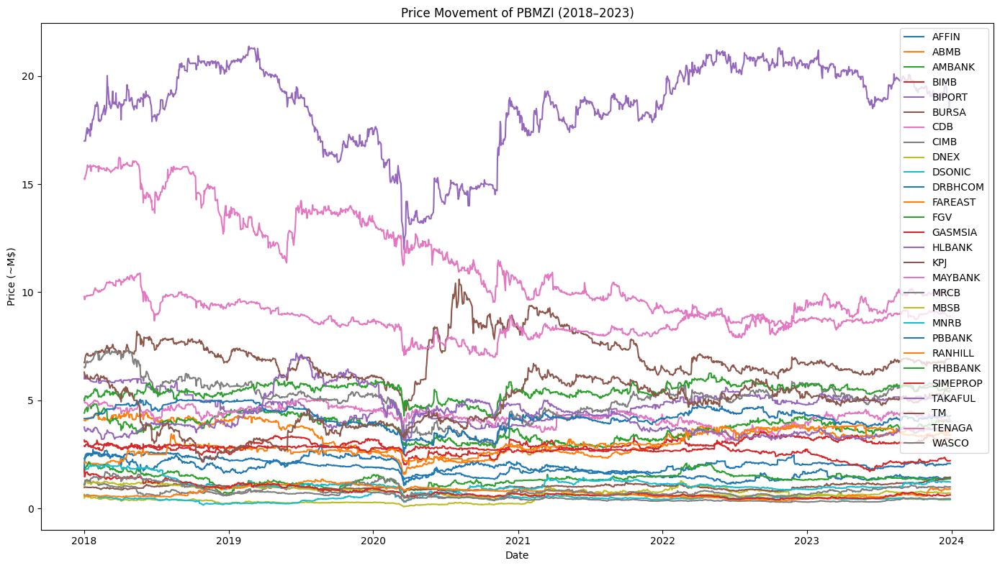

In [20]:
plt.figure(figsize=(14, 8))
for company in cleaned_PBMZI.columns[1:]:  # ubah ke semua jika perlu
    plt.plot(cleaned_PBMZI['Date'], cleaned_PBMZI[company], label=company)
plt.legend()
plt.title('Price Movement of PBMZI (2018–2023)')
plt.xlabel('Date')
plt.ylabel('Price (~M$)')
plt.tight_layout()
plt.show()


###4.2.2 Price Movement by Quarter

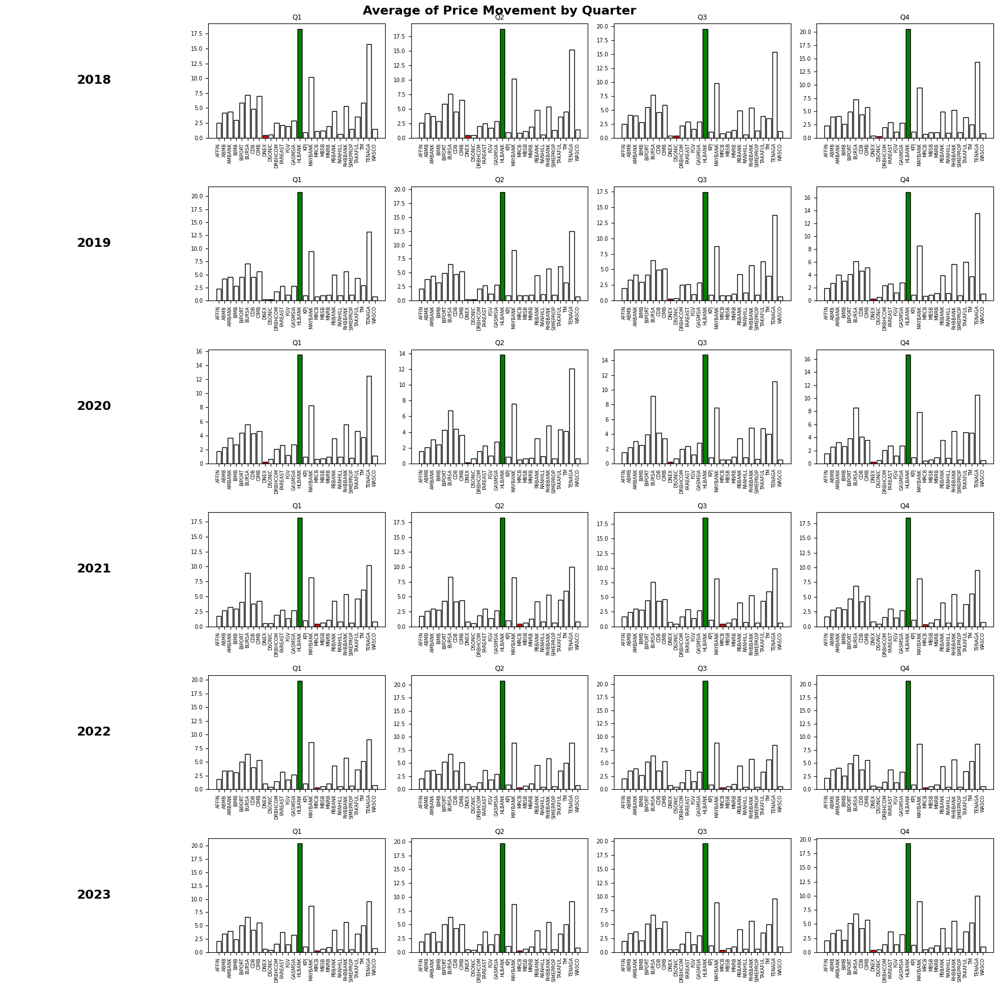

In [21]:
import matplotlib.pyplot as plt
import pandas as pd

# pastikan Date betul datetime
cleaned_PBMZI_movement=cleaned_PBMZI.copy()
cleaned_PBMZI_movement['Date'] = pd.to_datetime(cleaned_PBMZI_movement['Date'])
cleaned_PBMZI_movement['Year'] = cleaned_PBMZI_movement['Date'].dt.year
cleaned_PBMZI_movement['Quarter'] = cleaned_PBMZI_movement['Date'].dt.quarter

years = [2018, 2019, 2020, 2021, 2022, 2023]
quarters = [1, 2, 3, 4]

# kira purata setiap quarter ikut company
quarterly_avg = cleaned_PBMZI_movement.groupby(['Year', 'Quarter']).mean().reset_index()

fig, axes = plt.subplots(len(years), len(quarters)+1, figsize=(18, 18), sharex=False, sharey=False)

for i, year in enumerate(years):
    # Kolum pertama untuk label tahun
    axes[i, 0].axis("off")
    axes[i, 0].text(0.5, 0.5, str(year), fontsize=16, fontweight="bold", ha='center', va='center')

    for j, quarter in enumerate(quarters, start=1):
        ax = axes[i, j]

        # subset ikut tahun dan quarter
        df_subset = quarterly_avg[(quarterly_avg['Year'] == year) &
                                  (quarterly_avg['Quarter'] == quarter)]

        if not df_subset.empty:
            companies = cleaned_PBMZI_movement.columns[1:-2]  # exclude Date, Year, Quarter
            values = df_subset[companies].iloc[0]

            # cari max & min
            max_company = values.idxmax()
            min_company = values.idxmin()

            colors = []
            for company in companies:
                if company == max_company:
                    colors.append("green")
                elif company == min_company:
                    colors.append("red")
                else:
                    colors.append("white")

            # plot bar
            ax.bar(companies, values, color=colors, edgecolor="black")

        ax.set_title(f"Q{quarter}", fontsize=9)
        ax.tick_params(axis='x', rotation=90, labelsize=6)
        ax.tick_params(axis='y', labelsize=7)

fig.suptitle("Average of Price Movement by Quarter", fontsize=16, fontweight="bold", ha='center')
#plt.tight_layout(rect=[0,0,1,0.96])
plt.tight_layout()
plt.show()


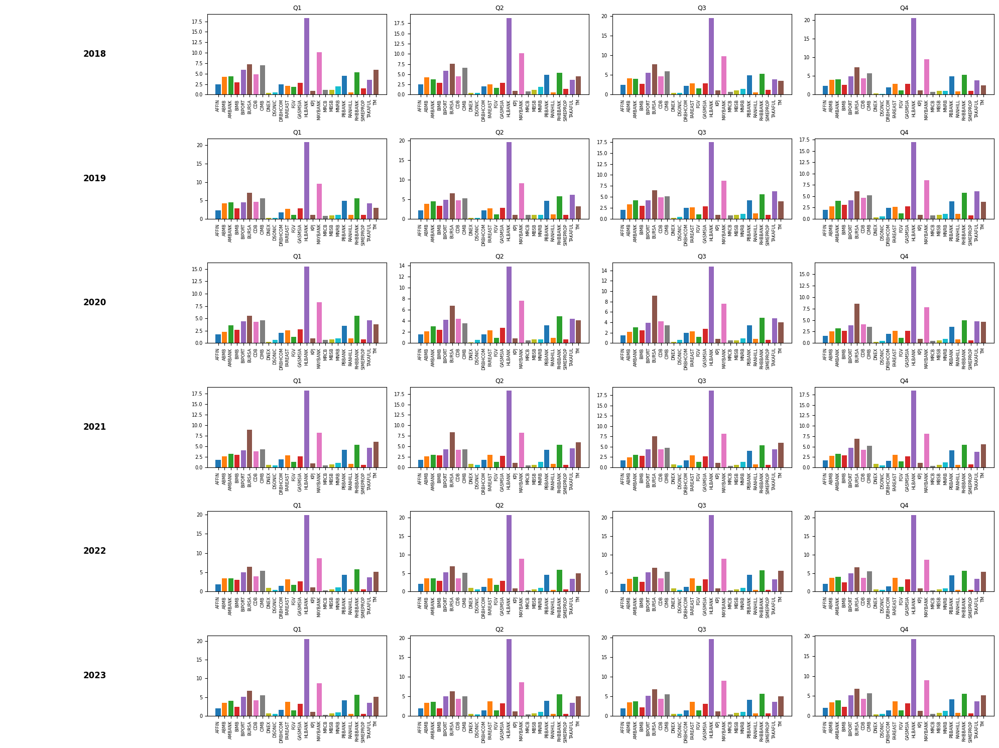

In [22]:
import matplotlib.pyplot as plt
import pandas as pd

# pastikan Date betul datetime
cleaned_PBMZI_movement=cleaned_PBMZI.copy()
cleaned_PBMZI_movement['Date'] = pd.to_datetime(cleaned_PBMZI_movement['Date'])
cleaned_PBMZI_movement['Year'] = cleaned_PBMZI_movement['Date'].dt.year
cleaned_PBMZI_movement['Quarter'] = cleaned_PBMZI_movement['Date'].dt.quarter

years = [2018, 2019, 2020, 2021, 2022, 2023]
quarters = [1, 2, 3, 4]

# kira purata setiap quarter ikut company
quarterly_avg = cleaned_PBMZI_movement.groupby(['Year', 'Quarter']).mean().reset_index()

fig, axes = plt.subplots(len(years), len(quarters)+1, figsize=(20, 15), sharex=False, sharey=False)

for i, year in enumerate(years):
    # Kolum pertama untuk tulis tahun
    axes[i, 0].axis("off")
    axes[i, 0].text(0.5, 0.5, str(year), fontsize=12, fontweight="bold", ha='center', va='center')

    for j, quarter in enumerate(quarters, start=1):
        ax = axes[i, j]

        # subset ikut tahun dan quarter
        df_subset = quarterly_avg[(quarterly_avg['Year'] == year) &
                                  (quarterly_avg['Quarter'] == quarter)]

        if not df_subset.empty:
            for company in cleaned_PBMZI.columns[1:-2]:  # exclude Date, Year, Quarter
                ax.bar(company, df_subset[company].values[0])

        ax.set_title(f"Q{quarter}", fontsize=9)
        ax.tick_params(axis='x', rotation=90, labelsize=6)
        ax.tick_params(axis='y', labelsize=7)

# adjust layout
plt.tight_layout()
plt.show()



## Return Movement

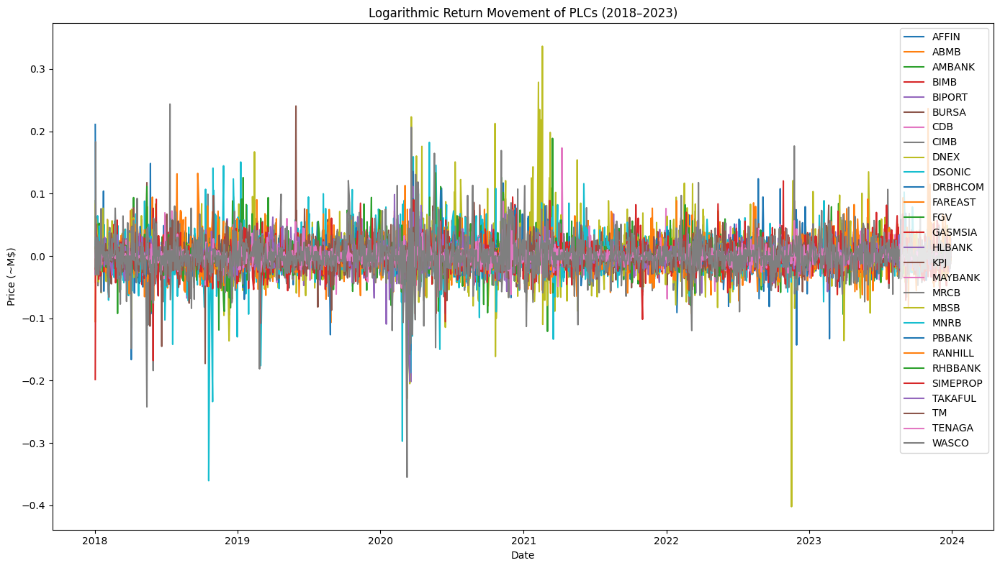

In [23]:
log_return_PBMZI = cleaned_PBMZI[cleaned_PBMZI.columns[1:]].apply(lambda col: np.log(col / col.shift(1)))
plt.figure(figsize=(14, 8))
for company in cleaned_PBMZI.columns[1:]:  # ubah ke semua jika perlu
    plt.plot(cleaned_PBMZI['Date'], log_return_PBMZI[company], label=company)
plt.legend()
plt.title('Logarithmic Return Movement of PLCs (2018–2023)')
plt.xlabel('Date')
plt.ylabel('Price (~M$)')
plt.tight_layout()
plt.show()


##4.3 Volatility Analysis (28 PBMZI)
*   https://www.strike.money/technical-analysis/volatility-analysis


###4.3.1 Volatility 30-day Rolling

####4.3.1.1 Volatility 30-day Rolling (2018-2023)

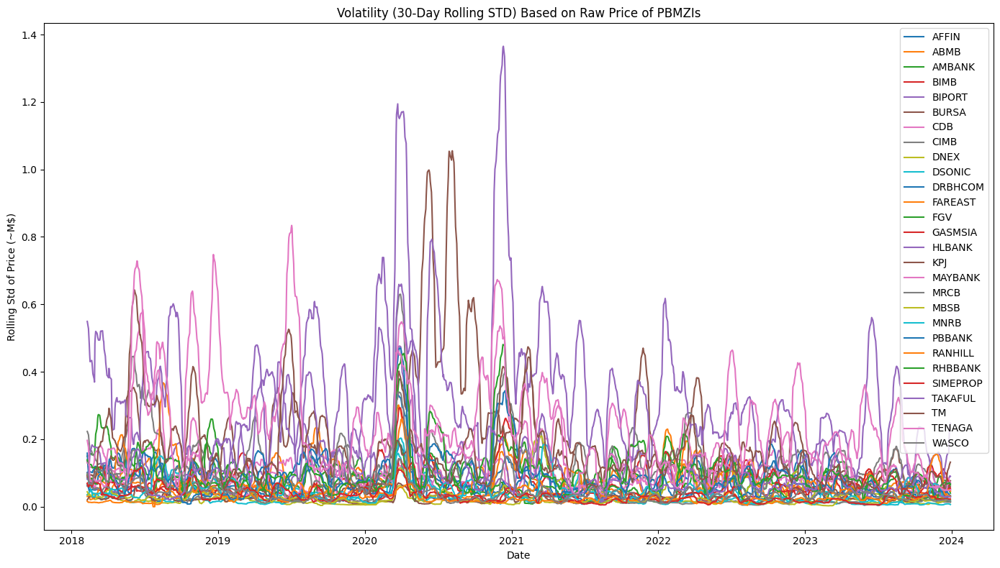

In [24]:
# Calculate 30-day rolling standard deviation (volatility) of raw price
volatility_price_raw = cleaned_PBMZI[cleaned_PBMZI.columns[1:]].rolling(window=30).std()

plt.figure(figsize=(14, 8))
for company in cleaned_PBMZI.columns[1:][:]:
    plt.plot(cleaned_PBMZI['Date'], volatility_price_raw[company], label=company)

plt.legend()
plt.title('Volatility (30-Day Rolling STD) Based on Raw Price of PBMZIs')
plt.xlabel('Date')
plt.ylabel('Rolling Std of Price (~M$)')
plt.tight_layout()
plt.show()


####4.3.1.1 Volatility 30-day Rolling by Quarter

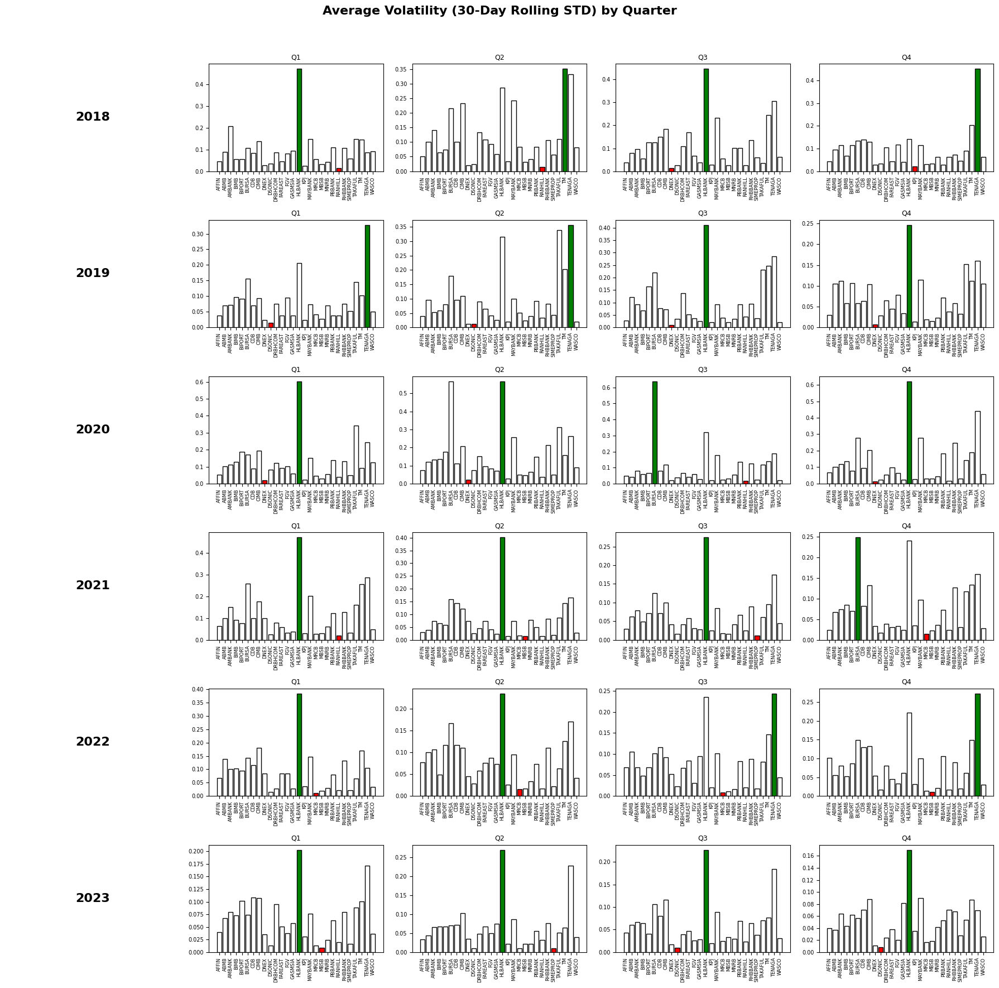

In [25]:
import matplotlib.pyplot as plt
import pandas as pd

# pastikan Date betul datetime
cleaned_PBMZI_volatility=cleaned_PBMZI.copy()
cleaned_PBMZI_volatility['Date'] = pd.to_datetime(cleaned_PBMZI_volatility['Date'])
cleaned_PBMZI_volatility['Year'] = cleaned_PBMZI_volatility['Date'].dt.year
cleaned_PBMZI_volatility['Quarter'] = cleaned_PBMZI_volatility['Date'].dt.quarter

years = [2018, 2019, 2020, 2021, 2022, 2023]
quarters = [1, 2, 3, 4]

# 30-day rolling standard deviation (volatility)
volatility_price_raw = cleaned_PBMZI_volatility[cleaned_PBMZI_volatility.columns[1:]].rolling(window=30).std()
volatility_price_raw['Date'] = cleaned_PBMZI_volatility['Date']
volatility_price_raw['Year'] = cleaned_PBMZI_volatility['Year']
volatility_price_raw['Quarter'] = cleaned_PBMZI_volatility['Quarter']

# purata volatility ikut quarter
quarterly_vol = volatility_price_raw.groupby(['Year', 'Quarter']).mean().reset_index()

# plot grid
fig, axes = plt.subplots(len(years), len(quarters)+1, figsize=(18, 18), sharex=False, sharey=False)

for i, year in enumerate(years):
    # Kolum pertama = label tahun
    axes[i, 0].axis("off")
    axes[i, 0].text(0.5, 0.5, str(year), fontsize=16, fontweight="bold", ha='center', va='center')

    for j, quarter in enumerate(quarters, start=1):
        ax = axes[i, j]

        # subset ikut tahun dan quarter
        df_subset = quarterly_vol[(quarterly_vol['Year'] == year) &
                                  (quarterly_vol['Quarter'] == quarter)]

        if not df_subset.empty:
            companies = cleaned_PBMZI_volatility.columns[1:-2]  # exclude Date, Year, Quarter
            values = df_subset[companies].iloc[0]

            # cari max & min volatility
            max_company = values.idxmax()
            min_company = values.idxmin()

            colors = []
            for company in companies:
                if company == max_company:
                    colors.append("green")
                elif company == min_company:
                    colors.append("red")
                else:
                    colors.append("white")

            # plot bar
            ax.bar(companies, values, color=colors, edgecolor="black")

        ax.set_title(f"Q{quarter}", fontsize=9)
        ax.tick_params(axis='x', rotation=90, labelsize=6)
        ax.tick_params(axis='y', labelsize=7)

# Tajuk besar untuk keseluruhan grid
fig.suptitle("Average Volatility (30-Day Rolling STD) by Quarter", fontsize=16, fontweight="bold", ha='center')

plt.tight_layout(rect=[0,0,1,0.96])
plt.show()


###4.3.2 Volatility 60-day Rolling

####4.3.2.1 Volatility 60-day Rolling (2018-2023)

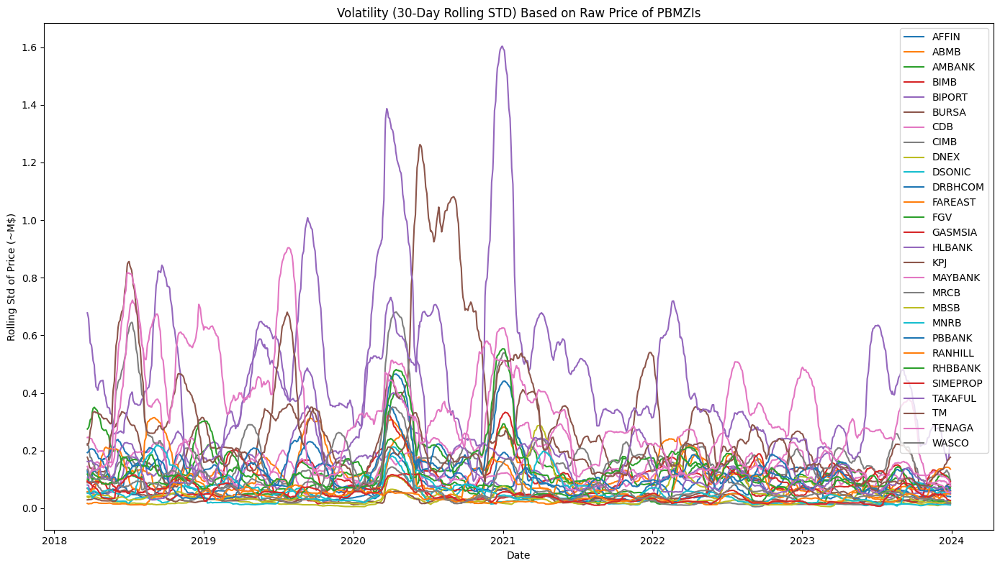

In [26]:
# Calculate 60-day rolling standard deviation (volatility) of raw price
volatility_price_raw = cleaned_PBMZI[cleaned_PBMZI.columns[1:]].rolling(window=60).std()

plt.figure(figsize=(14, 8))
for company in cleaned_PBMZI.columns[1:][:]:
    plt.plot(cleaned_PBMZI['Date'], volatility_price_raw[company], label=company)

plt.legend()
plt.title('Volatility (30-Day Rolling STD) Based on Raw Price of PBMZIs')
plt.xlabel('Date')
plt.ylabel('Rolling Std of Price (~M$)')
plt.tight_layout()
plt.show()


####4.3.2.2 Volatility 60-day Rolling by Quarter

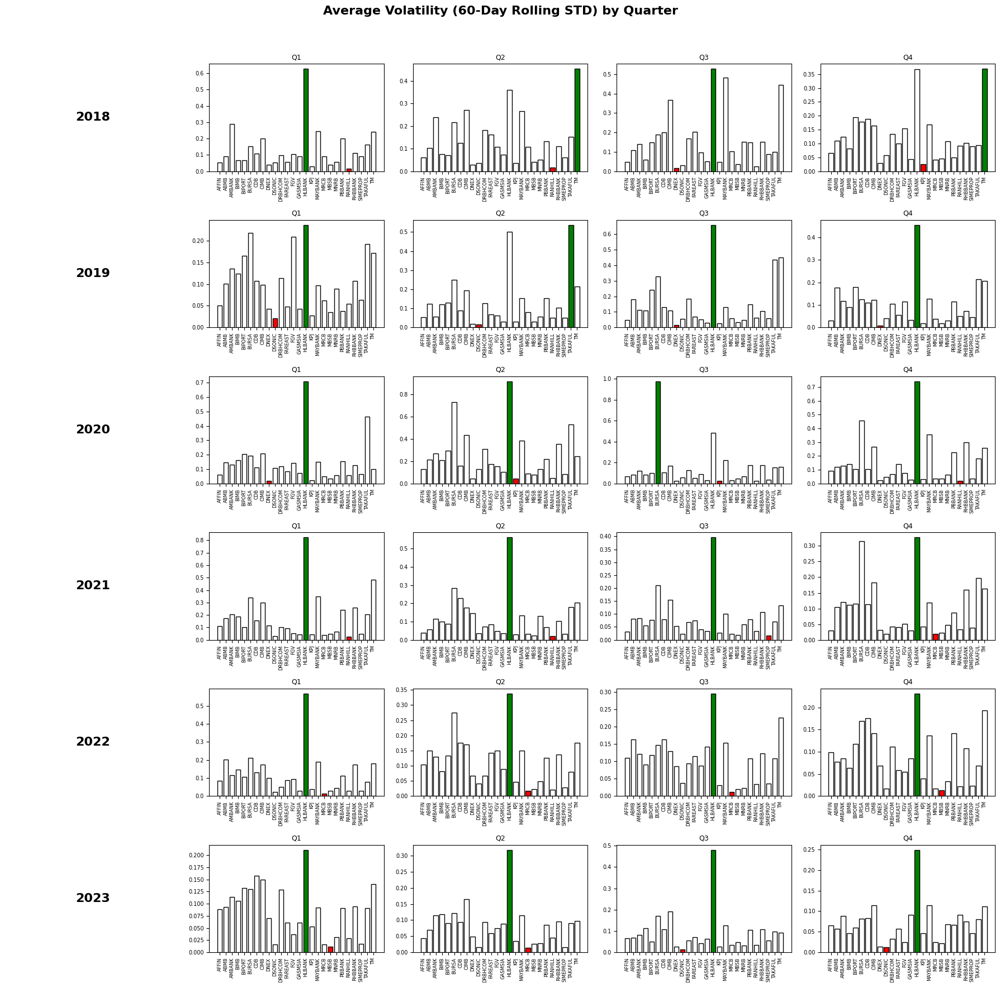

In [27]:
import matplotlib.pyplot as plt
import pandas as pd

# pastikan Date betul datetime
cleaned_PBMZI_volatility=cleaned_PBMZI.copy()
cleaned_PBMZI_volatility['Date'] = pd.to_datetime(cleaned_PBMZI_volatility['Date'])
cleaned_PBMZI_volatility['Year'] = cleaned_PBMZI_volatility['Date'].dt.year
cleaned_PBMZI_volatility['Quarter'] = cleaned_PBMZI_volatility['Date'].dt.quarter

years = [2018, 2019, 2020, 2021, 2022, 2023]
quarters = [1, 2, 3, 4]

# 30-day rolling standard deviation (volatility)
volatility_price_raw = cleaned_PBMZI_volatility[cleaned_PBMZI_volatility.columns[1:]].rolling(window=60).std()
volatility_price_raw['Date'] = cleaned_PBMZI_volatility['Date']
volatility_price_raw['Year'] = cleaned_PBMZI_volatility['Year']
volatility_price_raw['Quarter'] = cleaned_PBMZI_volatility['Quarter']

# purata volatility ikut quarter
quarterly_vol = volatility_price_raw.groupby(['Year', 'Quarter']).mean().reset_index()

# plot grid
fig, axes = plt.subplots(len(years), len(quarters)+1, figsize=(18, 18), sharex=False, sharey=False)

for i, year in enumerate(years):
    # Kolum pertama = label tahun
    axes[i, 0].axis("off")
    axes[i, 0].text(0.5, 0.5, str(year), fontsize=16, fontweight="bold", ha='center', va='center')

    for j, quarter in enumerate(quarters, start=1):
        ax = axes[i, j]

        # subset ikut tahun dan quarter
        df_subset = quarterly_vol[(quarterly_vol['Year'] == year) &
                                  (quarterly_vol['Quarter'] == quarter)]

        if not df_subset.empty:
            companies = cleaned_PBMZI.columns[1:-2]  # exclude Date, Year, Quarter
            values = df_subset[companies].iloc[0]

            # cari max & min volatility
            max_company = values.idxmax()
            min_company = values.idxmin()

            colors = []
            for company in companies:
                if company == max_company:
                    colors.append("green")
                elif company == min_company:
                    colors.append("red")
                else:
                    colors.append("white")

            # plot bar
            ax.bar(companies, values, color=colors, edgecolor="black")

        ax.set_title(f"Q{quarter}", fontsize=9)
        ax.tick_params(axis='x', rotation=90, labelsize=6)
        ax.tick_params(axis='y', labelsize=7)

# Tajuk besar untuk keseluruhan grid
fig.suptitle("Average Volatility (60-Day Rolling STD) by Quarter", fontsize=16, fontweight="bold", ha='center')

plt.tight_layout(rect=[0,0,1,0.96])
plt.show()


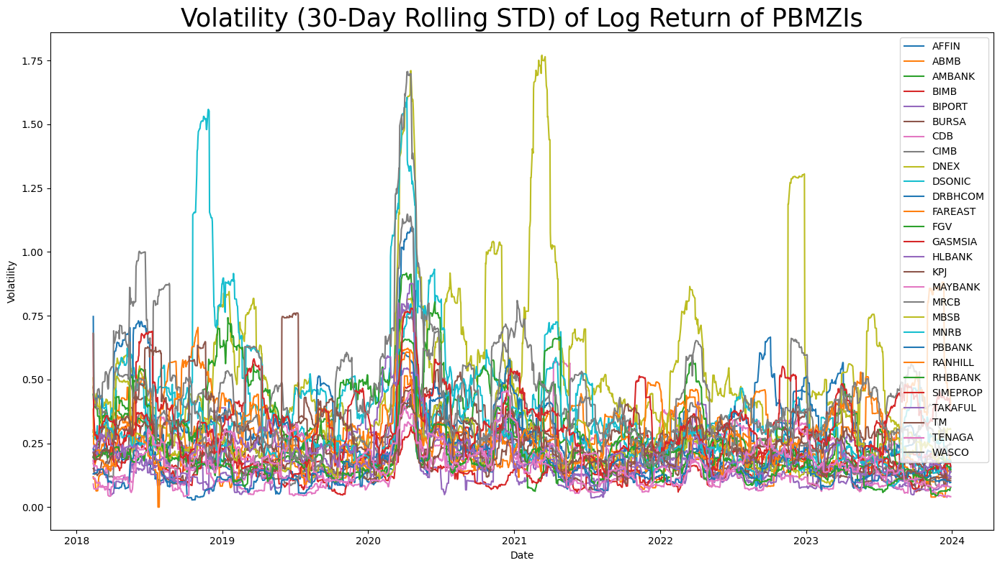

In [28]:
log_return_plc = cleaned_PBMZI[cleaned_PBMZI.columns[1:]].apply(lambda col: np.log(col / col.shift(1)))

volatility_30d = log_return_plc.rolling(window=30).std() * np.sqrt(252)  # annualized
plt.figure(figsize=(14, 8))
for company in cleaned_PBMZI.columns[1:][:]:
    plt.plot(cleaned_PBMZI['Date'], volatility_30d[company], label=company)
plt.legend()
plt.title('Volatility (30-Day Rolling STD) of Log Return of PBMZIs', size=25)
plt.xlabel('Date')
plt.ylabel('Volatility')
plt.tight_layout()
plt.show()


##4.4 Correlation (Pearson) between Companies


*   https://www.statisticssolutions.com/free-resources/directory-of-statistical-analyses/correlation-pearson-kendall-spearman/



###4.4.1 Correlation between Companies' Price across 2018-2023

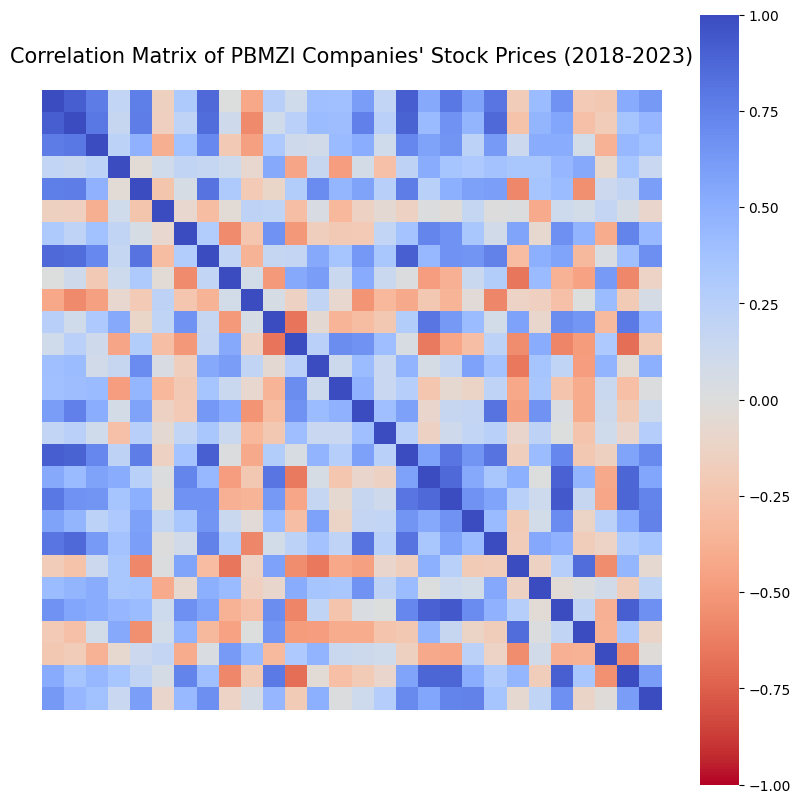

In [29]:
plt.figure(figsize=(10, 10))
sns.heatmap(cleaned_PBMZI[cleaned_PBMZI.columns[1:]].corr(method='pearson'), cmap='coolwarm_r', square=True, xticklabels=False, yticklabels=False, vmin=-1, vmax=1)
plt.title("Correlation Matrix of PBMZI Companies' Stock Prices (2018-2023)", size=15, pad=20)
plt.show()

Correlation Category Distribution:
Strong Negative\n[-1.0, -0.7)         0
Weak Negative\n[-0.7, -0.3)          52
No/Weak Correlation\n[-0.3, 0.3)    169
Weak Positive\n[0.3, 0.7)           119
Strong Positive\n[0.7, 1.0]          38
Name: count, dtype: int64


/tmp/ipython-input-3176419515.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax=sns.barplot(x=corr_distribution.index, y=corr_distribution.values, palette='coolwarm_r')


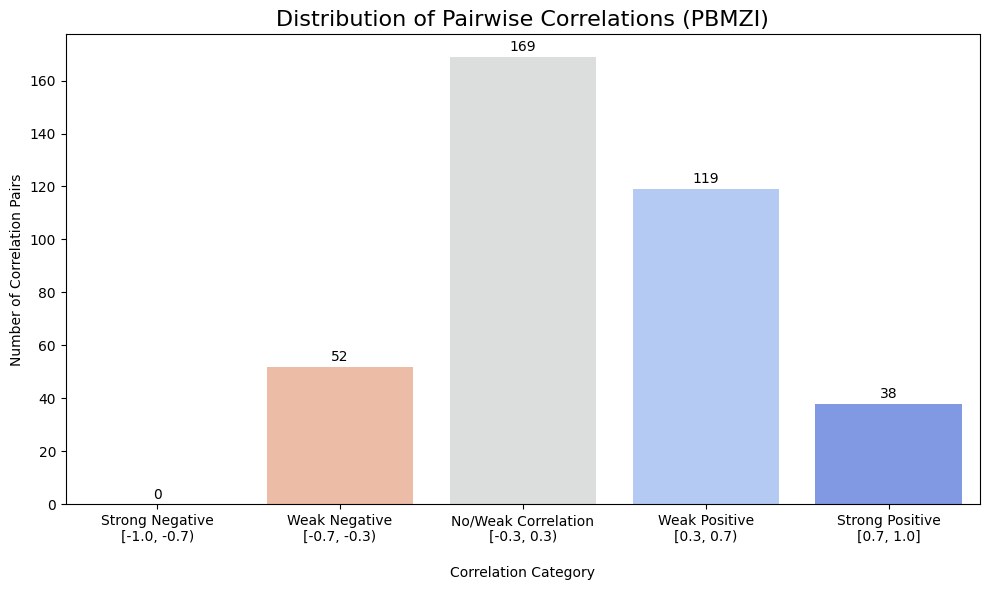

In [30]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Calculate the Spearman correlation matrix (excluding the 'date' column)
corr_matrix = cleaned_PBMZI[cleaned_PBMZI.columns[1:]].corr(method='pearson')

# 2. Remove self-correlations and keep only the lower triangle
mask = np.tril(np.ones(corr_matrix.shape), k=-1).astype(bool)
corr_values = corr_matrix.where(mask).stack().values  # 1D array of all pairwise correlations (excluding diagonal)

# 3. Categorize the correlation values
bins = [-1.0, -0.7, -0.3, 0.3, 0.7, 1.0]
labels = [
    'Strong Negative\n[-1.0, -0.7)',
    'Weak Negative\n[-0.7, -0.3)',
    'No/Weak Correlation\n[-0.3, 0.3)',
    'Weak Positive\n[0.3, 0.7)',
    'Strong Positive\n[0.7, 1.0]'
]
corr_categories = pd.cut(corr_values, bins=bins, labels=labels, right=False)

# 4. Count the number of correlations in each category
corr_distribution = corr_categories.value_counts().sort_index()

# 5. Print the distribution
print("Correlation Category Distribution:")
print(corr_distribution)

# 6. Optional: Plot the distribution
plt.figure(figsize=(10,6))
ax=sns.barplot(x=corr_distribution.index, y=corr_distribution.values, palette='coolwarm_r')
plt.xticks(rotation=0, ha='center')
plt.title("Distribution of Pairwise Correlations (PBMZI)", fontsize=16)
plt.ylabel("Number of Correlation Pairs")
plt.xlabel("\nCorrelation Category")
for p in ax.patches:
    height = p.get_height()
    ax.text(
        p.get_x() + p.get_width() / 2,  # x position
        height + 1,                     # y position slightly above bar
        f'{int(height)}',               # text label
        ha='center', va='bottom', fontsize=10
    )
plt.tight_layout()
plt.show()


###4.4.2 Correlation between Companies' Price Year by Year

/tmp/ipython-input-3796146313.py:30: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 1, 0.93, 1])  # kasi ruang sikit untuk colorbar
/tmp/ipython-input-3796146313.py:30: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 1, 0.93, 1])  # kasi ruang sikit untuk colorbar


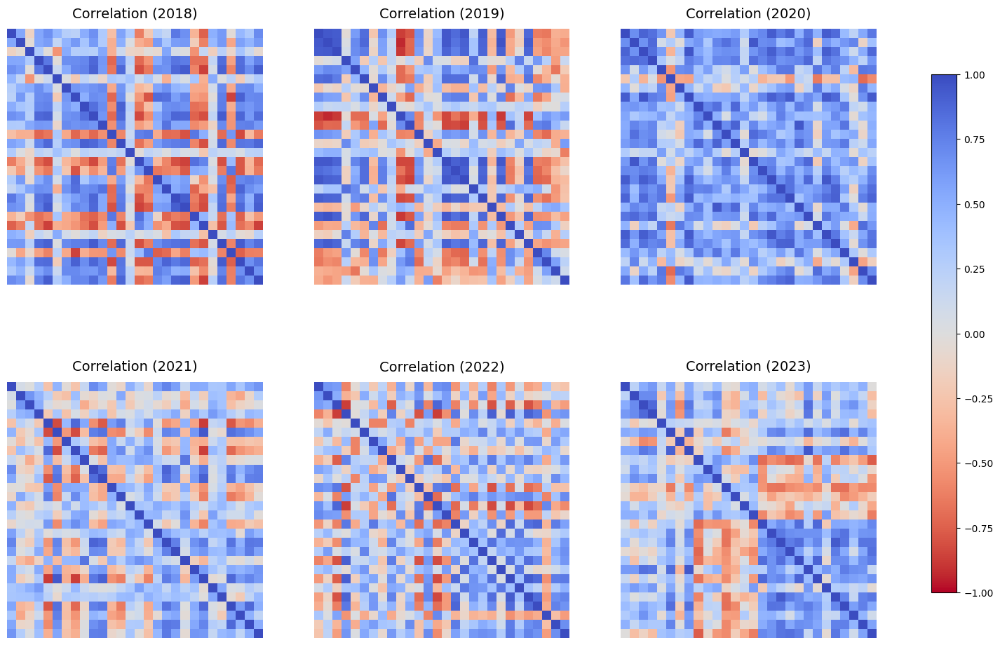

In [31]:
import matplotlib.pyplot as plt
import seaborn as sns

# Pastikan Date dalam format datetime
#cleaned_PBMZI['Date'] = pd.to_datetime(cleaned_PBMZI['Date'])

years = [2018, 2019, 2020, 2021, 2022, 2023]

fig, axes = plt.subplots(2, 3, figsize=(20, 12))
axes = axes.flatten()

# Simpan first heatmap object untuk dapatkan colorbar scale
heatmap = None

for i, year in enumerate(years):
    yearly_data = cleaned_PBMZI[cleaned_PBMZI['Date'].dt.year == year]
    corr_matrix = yearly_data[cleaned_PBMZI.columns[1:]].corr(method='pearson')

    heatmap = sns.heatmap(
        corr_matrix, cmap='coolwarm_r', square=True,
        xticklabels=False, yticklabels=False,
        cbar=False, ax=axes[i], vmin=-1, vmax=1   # set vmin/vmax untuk scale sama
    )

    axes[i].set_title(f"Correlation ({year})", fontsize=14, pad=12)

# Add one colorbar at the right
fig.colorbar(heatmap.collections[0], ax=axes, location="right", shrink=0.8)

plt.tight_layout(rect=[0, 1, 0.93, 1])  # kasi ruang sikit untuk colorbar
plt.show()


/tmp/ipython-input-2391291252.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=corr_distribution.index, y=corr_distribution.values,
/tmp/ipython-input-2391291252.py:45: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=0, ha='center')
/tmp/ipython-input-2391291252.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=corr_distribution.index, y=corr_distribution.values,
/tmp/ipython-input-2391291252.py:45: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.

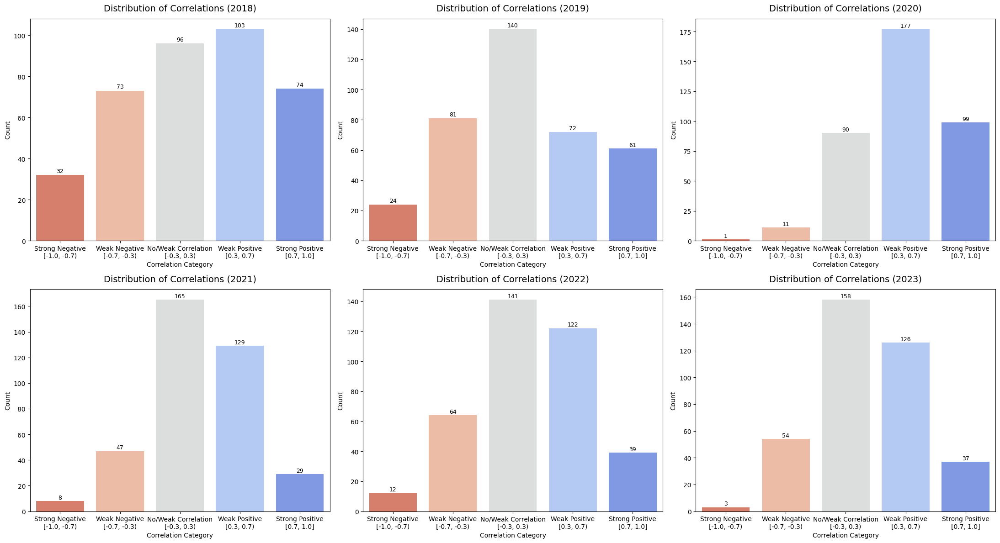

In [32]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Pastikan Date dalam datetime
#cleaned_PBMZI['Date'] = pd.to_datetime(cleaned_PBMZI['Date'])

years = [2018, 2019, 2020, 2021, 2022, 2023]

# Define bins and labels
bins = [-1.0, -0.7, -0.3, 0.3, 0.7, 1.0]
labels = [
    'Strong Negative\n[-1.0, -0.7)',
    'Weak Negative\n[-0.7, -0.3)',
    'No/Weak Correlation\n[-0.3, 0.3)',
    'Weak Positive\n[0.3, 0.7)',
    'Strong Positive\n[0.7, 1.0]'
]

fig, axes = plt.subplots(2, 3, figsize=(22, 12))
axes = axes.flatten()

for i, year in enumerate(years):
    yearly_data = cleaned_PBMZI[cleaned_PBMZI['Date'].dt.year == year]

    # Correlation matrix (Pearson)
    corr_matrix = yearly_data[cleaned_PBMZI.columns[1:]].corr(method='pearson')

    # Remove self-correlations & upper triangle
    mask = np.tril(np.ones(corr_matrix.shape), k=-1).astype(bool)
    corr_values = corr_matrix.where(mask).stack().values

    # Categorize correlations
    corr_categories = pd.cut(corr_values, bins=bins, labels=labels, right=False)
    corr_distribution = corr_categories.value_counts().sort_index()

    # Barplot
    ax = axes[i]
    sns.barplot(x=corr_distribution.index, y=corr_distribution.values,
                palette='coolwarm_r', ax=ax)
    ax.set_title(f"Distribution of Correlations ({year})", fontsize=14, pad=12)
    ax.set_ylabel("Count")
    ax.set_xlabel("Correlation Category")
    ax.set_xticklabels(ax.get_xticklabels(), rotation=0, ha='center')

    # Add labels on top of bars
    for p in ax.patches:
        height = p.get_height()
        ax.text(p.get_x() + p.get_width()/2, height + 0.5,
                f"{int(height)}", ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()

###4.4.3 Correlation between Companies' Log Return across 2018-2023

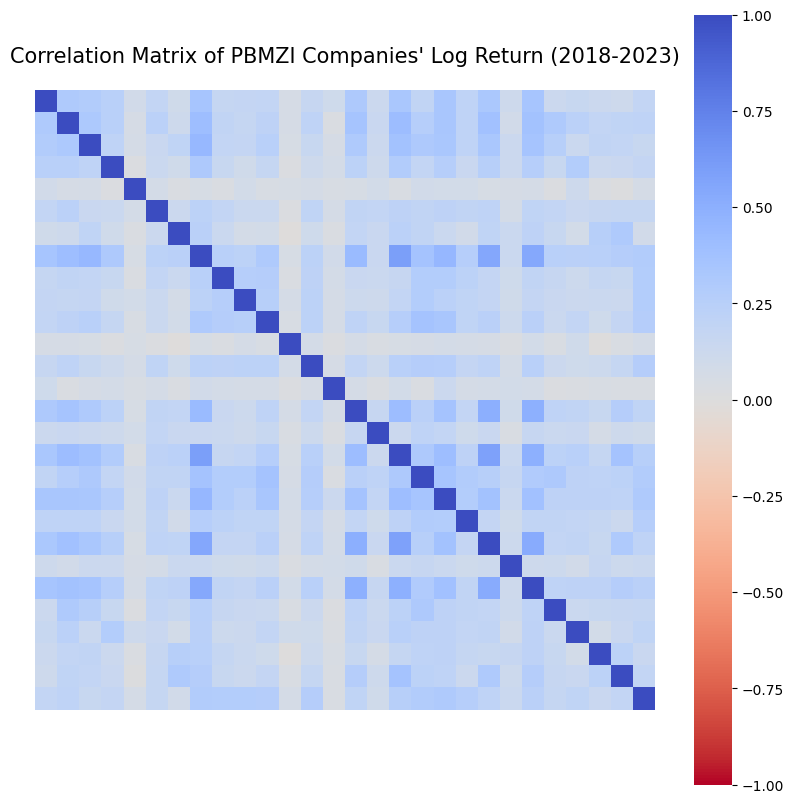

In [33]:
plt.figure(figsize=(10, 10))
sns.heatmap(cleaned_PBMZI[cleaned_PBMZI.columns[1:]].apply(lambda col: np.log(col / col.shift(1))).corr(method='pearson'),
            cmap='coolwarm_r',
            square=True,
            xticklabels=False,
            yticklabels=False,
            vmin=-1, vmax=1 )
plt.title("Correlation Matrix of PBMZI Companies' Log Return (2018-2023)", size=15, pad=20)
plt.show()

/tmp/ipython-input-1226125893.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=log_corr_distribution.index, y=log_corr_distribution.values, palette='coolwarm_r')


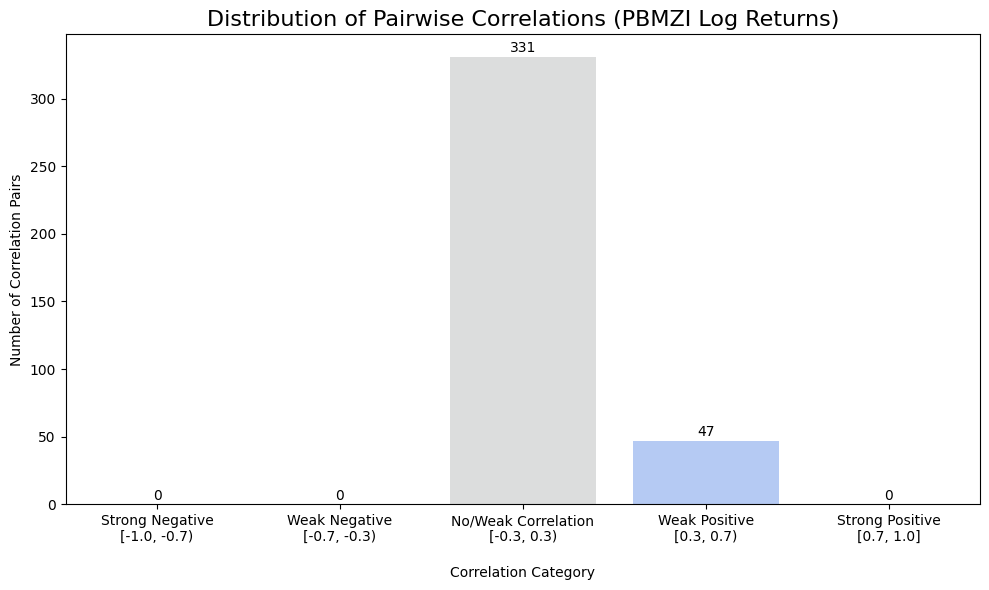

In [34]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Kira log return (ln(Pt / Pt-1))
log_return_df = cleaned_PBMZI.copy()
log_return_df.iloc[:, 1:] = log_return_df.iloc[:, 1:].apply(lambda col: np.log(col / col.shift(1)))

# 2. Spearman correlation matrix untuk log return
log_corr_matrix = log_return_df.iloc[:, 1:].corr(method='pearson')

# 3. Ambil lower triangle sahaja (tanpa diagonal)
mask = np.tril(np.ones(log_corr_matrix.shape), k=-1).astype(bool)
log_corr_values = log_corr_matrix.where(mask).stack().values

# 4. Kategori correlation
bins = [-1.0, -0.7, -0.3, 0.3, 0.7, 1.0]
labels = [
    'Strong Negative\n[-1.0, -0.7)',
    'Weak Negative\n[-0.7, -0.3)',
    'No/Weak Correlation\n[-0.3, 0.3)',
    'Weak Positive\n[0.3, 0.7)',
    'Strong Positive\n[0.7, 1.0]'
]
log_corr_categories = pd.cut(log_corr_values, bins=bins, labels=labels, right=False)

# 5. Dapatkan bilangan dalam setiap kategori
log_corr_distribution = log_corr_categories.value_counts().sort_index()

# 6. Papar barplot dengan label nilai
plt.figure(figsize=(10, 6))
ax = sns.barplot(x=log_corr_distribution.index, y=log_corr_distribution.values, palette='coolwarm_r')
plt.xticks(rotation=0, ha='center')
plt.title("Distribution of Pairwise Correlations (PBMZI Log Returns)", fontsize=16)
plt.ylabel("Number of Correlation Pairs")
plt.xlabel("\nCorrelation Category")

# 7. Label nilai atas bar
for p in ax.patches:
    height = p.get_height()
    ax.text(
        p.get_x() + p.get_width() / 2,
        height + 1,
        f'{int(height)}',
        ha='center', va='bottom', fontsize=10
    )

plt.tight_layout()
plt.show()


###4.4.4 Correlation between Companies' Log Return Year by Year

/tmp/ipython-input-530856427.py:37: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 1, 0.93, 1])
/tmp/ipython-input-530856427.py:37: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 1, 0.93, 1])


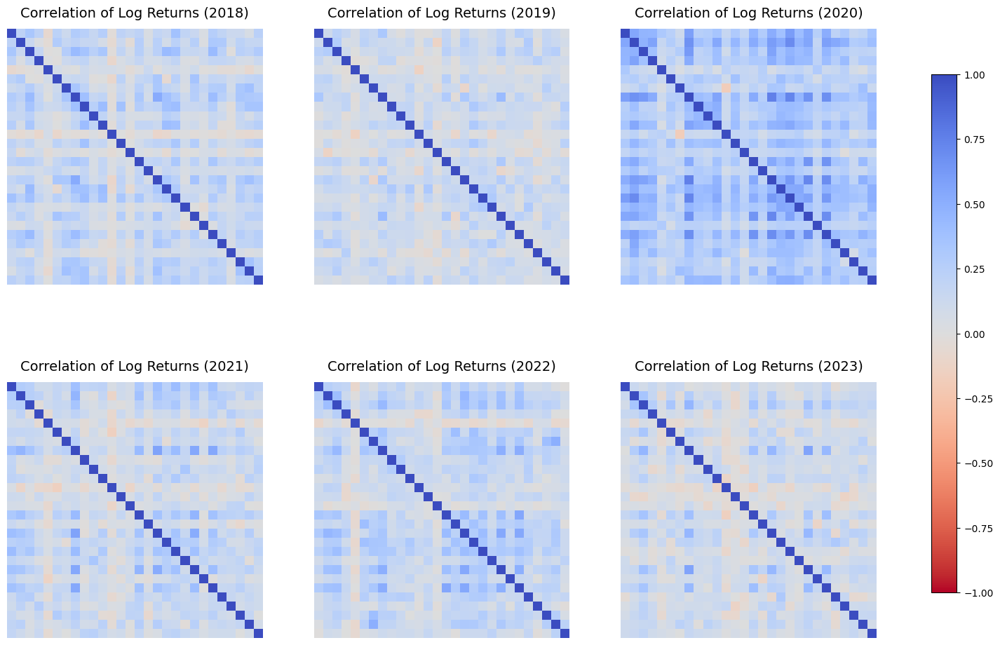

In [35]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Pastikan Date dalam datetime
#cleaned_PBMZI['Date'] = pd.to_datetime(cleaned_PBMZI['Date'])

# Kira log return sekali awal² supaya jimat masa
log_return = cleaned_PBMZI.copy()
log_return[log_return.columns[1:]] = log_return[log_return.columns[1:]].apply( lambda col: np.log(col / col.shift(1)))

years = [2018, 2019, 2020, 2021, 2022, 2023]

fig, axes = plt.subplots(2, 3, figsize=(20, 12))
axes = axes.flatten()

heatmap = None
for i, year in enumerate(years):
    yearly_data = log_return[log_return['Date'].dt.year == year]

    # Correlation matrix for log return
    corr_matrix = yearly_data[log_return.columns[1:]].corr(method='pearson')

    # Heatmap
    heatmap = sns.heatmap(
        corr_matrix, cmap='coolwarm_r', square=True,
        xticklabels=False, yticklabels=False,
        cbar=False, ax=axes[i], vmin=-1, vmax=1
    )

    axes[i].set_title(f"Correlation of Log Returns ({year})", fontsize=14, pad=12)

# Add one colorbar on the right
fig.colorbar(heatmap.collections[0], ax=axes, location="right", shrink=0.8)

plt.tight_layout(rect=[0, 1, 0.93, 1])
plt.show()


/tmp/ipython-input-1024436795.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=log_corr_distribution.index, y=log_corr_distribution.values,
/tmp/ipython-input-1024436795.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=0, ha='center')
/tmp/ipython-input-1024436795.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=log_corr_distribution.index, y=log_corr_distribution.values,
/tmp/ipython-input-1024436795.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set

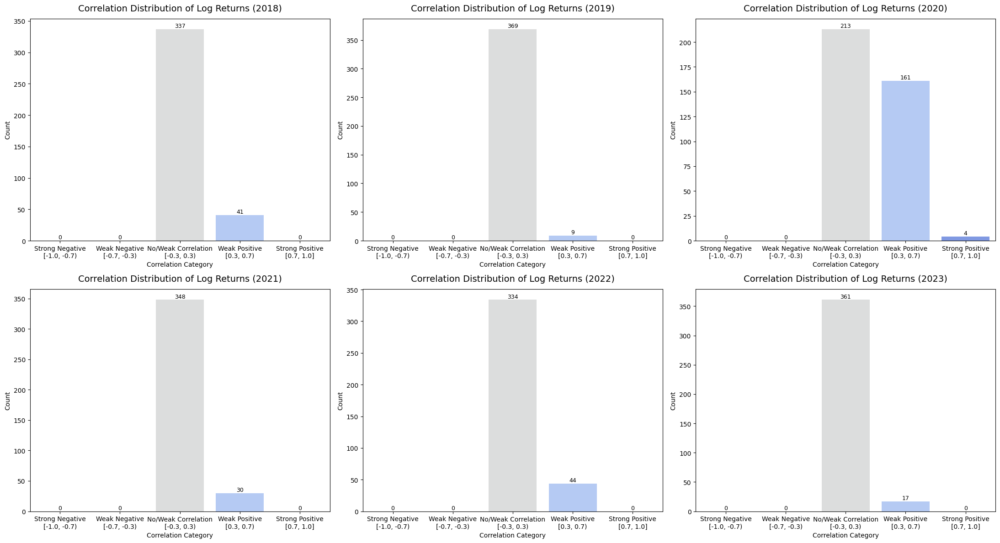

In [36]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Kira log return (ln(Pt / Pt-1))
log_return_df = cleaned_PBMZI.copy()
log_return_df.iloc[:, 1:] = log_return_df.iloc[:, 1:].apply(lambda col: np.log(col / col.shift(1)))

# 2. Senarai tahun
years = [2018, 2019, 2020, 2021, 2022, 2023]

# 3. Bins & labels untuk kategori correlation
bins = [-1.0, -0.7, -0.3, 0.3, 0.7, 1.0]
labels = [
    'Strong Negative\n[-1.0, -0.7)',
    'Weak Negative\n[-0.7, -0.3)',
    'No/Weak Correlation\n[-0.3, 0.3)',
    'Weak Positive\n[0.3, 0.7)',
    'Strong Positive\n[0.7, 1.0]'
]

# 4. Buat subplot grid 2×3
fig, axes = plt.subplots(2, 3, figsize=(22, 12))
axes = axes.flatten()

for i, year in enumerate(years):
    yearly_data = log_return_df[log_return_df['Date'].dt.year == year]

    # Spearman correlation matrix untuk log return
    log_corr_matrix = yearly_data.iloc[:, 1:].corr(method='pearson')

    # Ambil lower triangle sahaja
    mask = np.tril(np.ones(log_corr_matrix.shape), k=-1).astype(bool)
    log_corr_values = log_corr_matrix.where(mask).stack().values

    # Kategorikan correlation
    log_corr_categories = pd.cut(log_corr_values, bins=bins, labels=labels, right=False)
    log_corr_distribution = log_corr_categories.value_counts().sort_index()

    # Plot barplot
    ax = axes[i]
    sns.barplot(x=log_corr_distribution.index, y=log_corr_distribution.values,
                palette='coolwarm_r', ax=ax)

    ax.set_title(f"Correlation Distribution of Log Returns ({year})", fontsize=14, pad=12)
    ax.set_ylabel("Count")
    ax.set_xlabel("Correlation Category")
    ax.set_xticklabels(ax.get_xticklabels(), rotation=0, ha='center')

    # Label atas bar
    for p in ax.patches:
        height = p.get_height()
        ax.text(p.get_x() + p.get_width()/2, height + 0.5,
                f"{int(height)}", ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()


##4.5 Drawdown & Maximum Returns (27 PBMZI)


*  Drawdown bermaksud: Penurunan paling besar dari harga tertinggi (peak) ke harga terendah berikutnya (trough)
*   Max return bermaksud: Kenaikan maksimum antara dua titik (harga paling rendah → harga paling tinggi)
*   https://www.investopedia.com/terms/m/maximum-drawdown-mdd.asp



In [37]:
drawdown_data = []
for company in cleaned_PBMZI.columns[1:]:
    price = cleaned_PBMZI[company]
    peak = price.cummax()
    drawdown = (price - peak) / peak
    max_drawdown = drawdown.min()
    max_return = (price.max() - price.min()) / price.min()

    drawdown_data.append({
        'COMPANY': company,
        'MAX DRAWDOWN (%)': round(max_drawdown * 100, 2),
        'MAX RETURN (%)': round(max_return * 100, 2)
    })

drawdown_df = pd.DataFrame(drawdown_data)
drawdown_df.sort_values(by='MAX DRAWDOWN (%)', inplace=True)
print(drawdown_df)


     COMPANY  MAX DRAWDOWN (%)  MAX RETURN (%)
8       DNEX            -85.59         1487.50
17      MRCB            -77.91          352.63
23  SIMEPROP            -77.53          345.00
27     WASCO            -77.25          339.48
9     DSONIC            -76.25          449.34
19      MNRB            -75.86          314.20
21   RANHILL            -73.95          283.85
12       FGV            -70.47          238.58
25        TM            -65.87          211.63
1       ABMB            -64.96          185.35
10   DRBHCOM            -64.07          178.30
18      MBSB            -62.70          168.09
7       CIMB            -60.33          152.07
24   TAKAFUL            -56.13          127.94
26    TENAGA            -51.42          105.83
20    PBBANK            -50.00          100.00
3       BIMB            -49.27           97.13
0      AFFIN            -49.24           96.99
4     BIPORT            -47.09           88.99
5      BURSA            -46.03          139.82
14    HLBANK 

###4.5.1 Drawdown & Maximum Returns per Company (PBMZI) across 2018-2023

/tmp/ipython-input-2863811209.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab20', len(drawdown_df))


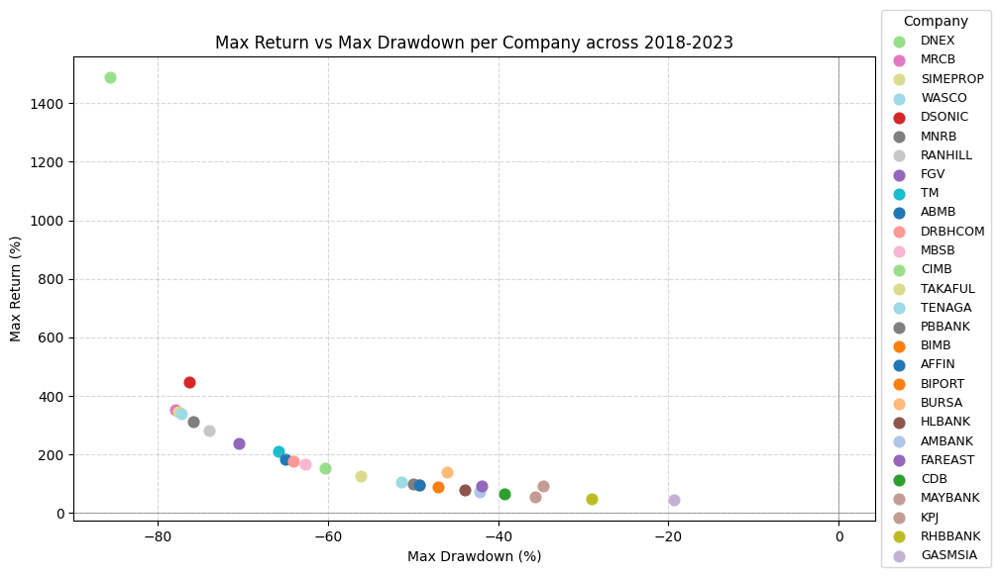

In [38]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

# Pilih colormap dan hasilkan warna unik untuk setiap syarikat
colors = cm.get_cmap('tab20', len(drawdown_df))

plt.figure(figsize=(10, 6))

# Plot setiap syarikat dengan warna unik dan label legend
for i, row in drawdown_df.iterrows():
    plt.scatter(row['MAX DRAWDOWN (%)'], row['MAX RETURN (%)'],
                color=colors(i), label=row['COMPANY'], s=60)


plt.xlabel('Max Drawdown (%)')
plt.ylabel('Max Return (%)')
plt.title('Max Return vs Max Drawdown per Company across 2018-2023')
plt.grid(True, linestyle='--', alpha=0.5)
plt.axhline(0, color='gray', linewidth=0.5)
plt.axvline(0, color='gray', linewidth=0.5)
handles, labels = plt.gca().get_legend_handles_labels()
plt.legend(handles, labels, bbox_to_anchor=(1.0, 0.5), loc='center left', fontsize=9, title="Company", title_fontsize=10)
plt.tight_layout(rect=[0, 0, 1.02, 1])  # kasi ruang kanan untuk legend
plt.show()


###4.5.2 Drawdown & Maximum Returns per Company (PBMZI) Year by Year

/tmp/ipython-input-2752054820.py:15: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab20', len(companies))


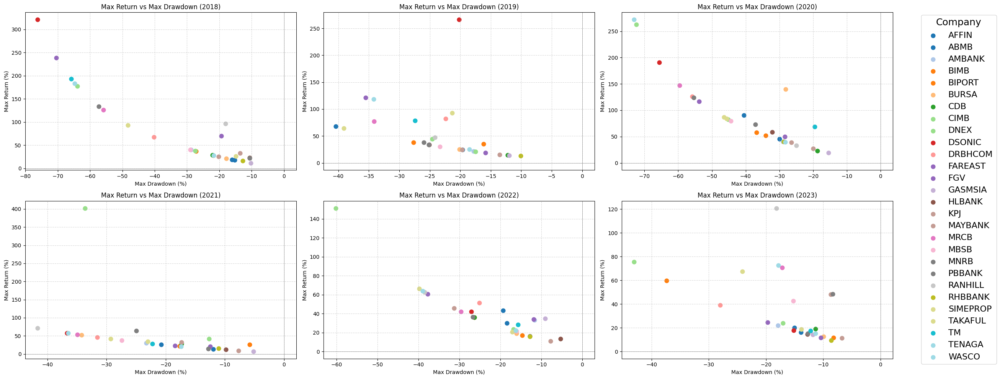

In [39]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

# Pastikan Date dalam datetime
cleaned_PBMZI['Date'] = pd.to_datetime(cleaned_PBMZI['Date'])

years = [2018, 2019, 2020, 2021, 2022, 2023]

fig, axes = plt.subplots(2, 3, figsize=(24, 10))  # besarkan sikit untuk muat legend
axes = axes.flatten()

# Ambil senarai syarikat sekali saja
companies = cleaned_PBMZI.columns[1:]
colors = cm.get_cmap('tab20', len(companies))

for i, year in enumerate(years):
    yearly_data = cleaned_PBMZI[cleaned_PBMZI['Date'].dt.year == year]

    drawdown_by_year_data = []
    for company in companies:
        price = yearly_data[company]
        peak = price.cummax()
        drawdown = (price - peak) / peak
        max_drawdown = drawdown.min()
        max_return = (price.max() - price.min()) / price.min()

        drawdown_by_year_data.append({
            'COMPANY': company,
            'MAX DRAWDOWN (%)': round(max_drawdown * 100, 2),
            'MAX RETURN (%)': round(max_return * 100, 2)
        })

    drawdown_by_year_df = pd.DataFrame(drawdown_by_year_data)

    ax = axes[i]
    for j, row in drawdown_by_year_df.iterrows():
        ax.scatter(row['MAX DRAWDOWN (%)'], row['MAX RETURN (%)'],
                   color=colors(j), label=row['COMPANY'], s=60)

    ax.set_xlabel("Max Drawdown (%)")
    ax.set_ylabel("Max Return (%)")
    ax.set_title(f"Max Return vs Max Drawdown ({year})")
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.axhline(0, color='gray', linewidth=0.5)
    ax.axvline(0, color='gray', linewidth=0.5)

# Buat global legend kat kanan figure
handles, labels = plt.gca().get_legend_handles_labels()
fig.legend(handles, labels, bbox_to_anchor=(1.0, 0.5), loc='center left', fontsize=16, title="Company", title_fontsize=18)

plt.tight_layout(rect=[0, 0, 0.98, 1])  # kasi ruang kanan untuk legend
plt.show()


#5. DESCRIPTIVE ANALYSIS

##5.1 Mean Price (each company)

In [40]:
cleaned_PBMZI.describe().T

,count,mean,min,25%,50%,75%,max,std
Date,1565,2020-12-30 00:00:00,2018-01-01 00:00:00,2019-07-02 00:00:00,2020-12-30 00:00:00,2022-06-30 00:00:00,2023-12-29 00:00:00,NaN
AFFIN,1565.0,1.980633,1.33,1.74,1.99,2.17,2.62,0.298051
ABMB,1565.0,3.249936,1.57,2.63,3.38,3.78,4.48,0.689502
AMBANK,1565.0,3.703029,2.8,3.25,3.77,4.05,4.84,0.493082
BIMB,1565.0,2.700485,1.71,2.5,2.76,2.927,3.371,0.339944
BIPORT,1565.0,4.762882,3.27,4.3,4.83,5.15,6.18,0.582939
BURSA,1565.0,7.097496,4.42,6.4,6.89,7.65,10.6,0.963323
CDB,1565.0,4.276109,3.1,4.08,4.3,4.53,5.1,0.384428
CIMB,1565.0,5.124863,2.9,4.78,5.21,5.65,7.31,0.890187
DNEX,1565.0,0.489636,0.08,0.27,0.42,0.735,1.27,0.257369


##5.2 Average of Log Return 2018-2023

,Date,AFFIN,ABMB,AMBANK,BIMB,BIPORT,BURSA,CDB,CIMB,DNEX,...,MBSB,MNRB,PBBANK,RANHILL,RHBBANK,SIMEPROP,TAKAFUL,TM,TENAGA,WASCO
0,2018-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2018-01-02,0.012903,-0.004914,0.009029,-0.027628,0.029559,0.000000,-0.042048,-0.006135,0.088728,...,0.082997,0.000000,-0.000963,-0.105187,0.011929,-0.198177,-0.029692,-0.020851,-0.002625,-0.017360
2,2018-01-03,0.012739,0.000000,0.024419,0.002278,0.000000,0.027195,-0.002047,0.004605,0.018692,...,0.017544,0.021703,0.000000,0.013770,0.015687,0.040274,-0.013793,-0.003247,0.005242,0.183089
3,2018-01-04,0.037271,-0.002466,0.006557,0.007124,-0.029559,0.011473,0.004090,0.003058,0.009217,...,-0.008734,0.012911,-0.000964,0.006814,0.011606,0.051293,0.000000,-0.019705,0.006515,-0.030388
4,2018-01-05,0.016129,0.012270,0.002176,0.006754,0.000000,0.011343,-0.002043,0.022642,0.009132,...,0.059592,0.020426,0.001927,-0.006814,-0.003854,0.036814,-0.011173,-0.001660,0.001298,0.023457


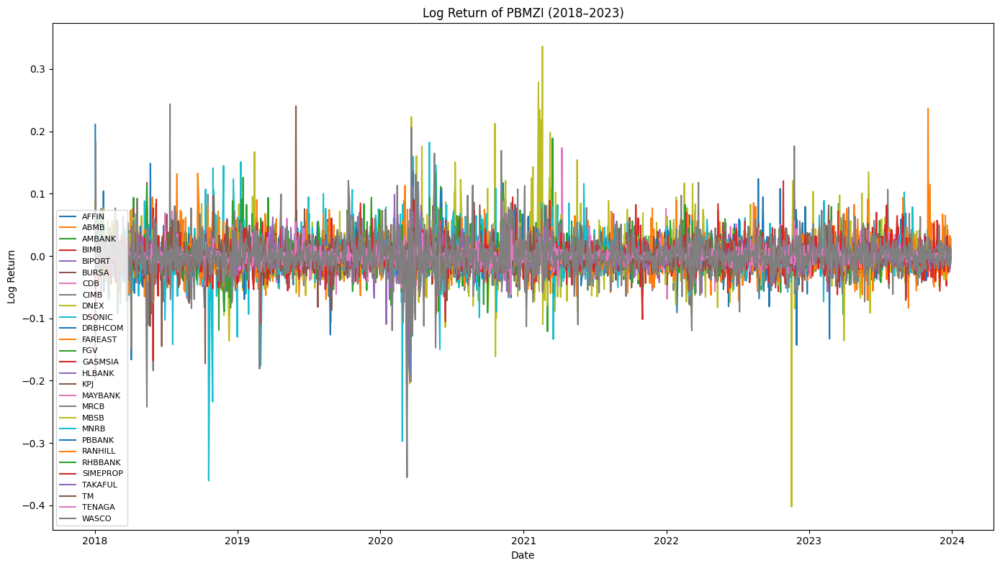

In [69]:
plt.figure(figsize=(14, 8))
for company in log_return_price.columns[1:]:  # Iterate through companies, excluding 'Date'
    plt.plot(log_return_price['Date'], log_return_price[company], label=company)

plt.title('Log Return of PBMZI (2018–2023)')
plt.xlabel('Date')
plt.ylabel('Log Return')
plt.legend(fontsize=8)
plt.tight_layout()
plt.show()

In [41]:
# Pastikan tarikh dalam format datetime
cleaned_PBMZI['Date'] = pd.to_datetime(cleaned_PBMZI['Date'])

# Senarai nama syarikat (exclude 'date')
cleaned_list = cleaned_PBMZI.columns.drop('Date')

# Buat log return dan gabungkan dengan date
log_return_df = pd.concat([
    cleaned_PBMZI[['Date']],
    cleaned_PBMZI[cleaned_list].apply(lambda col: np.log(col / col.shift(1)))
], axis=1)

# Tambah kolum tahun
log_return_df['Year'] = log_return_df['Date'].dt.year

# Buang NaN sebab shift(1)
log_return_df = log_return_df.dropna()

# Kira purata return untuk setiap tahun bagi semua syarikat
avg_return_by_year = log_return_df.groupby('Year')[cleaned_list].mean()

# Kira purata keseluruhan untuk setiap tahun
avg_return_by_year['Average of return'] = avg_return_by_year.mean(axis=1)

# Reset index untuk jadi DataFrame biasa
final_avg_return = avg_return_by_year[['Average of return']].reset_index()

# Papar
print(final_avg_return)


   Year  Average of return
0  2018          -0.000807
1  2019           0.000395
2  2020          -0.000350
3  2021          -0.000086
4  2022           0.000003
5  2023           0.000289


# New Section

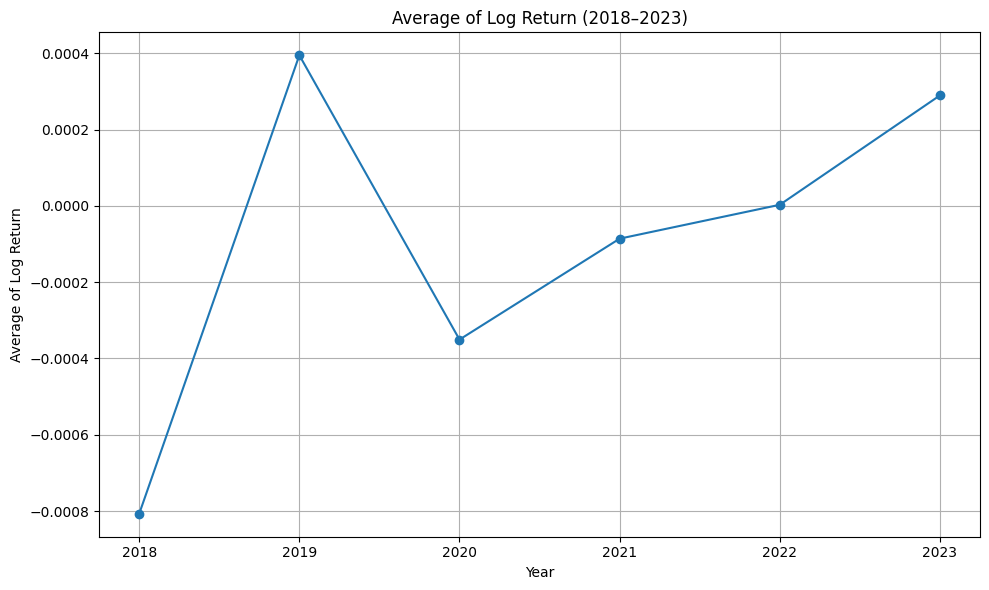

In [42]:
plt.figure(figsize=(10, 6))

# Plot graf garisan
plt.plot(final_avg_return['Year'], final_avg_return['Average of return'], marker='o', linestyle='-')

# Hiasan graf
plt.title('Average of Log Return (2018–2023)')
plt.xlabel('Year')
plt.ylabel('Average of Log Return')
plt.grid(True)
plt.xticks(final_avg_return['Year'])  # pastikan setiap tahun muncul
plt.tight_layout()
plt.show()

##5.3 Average of Log Return across 2018-2023

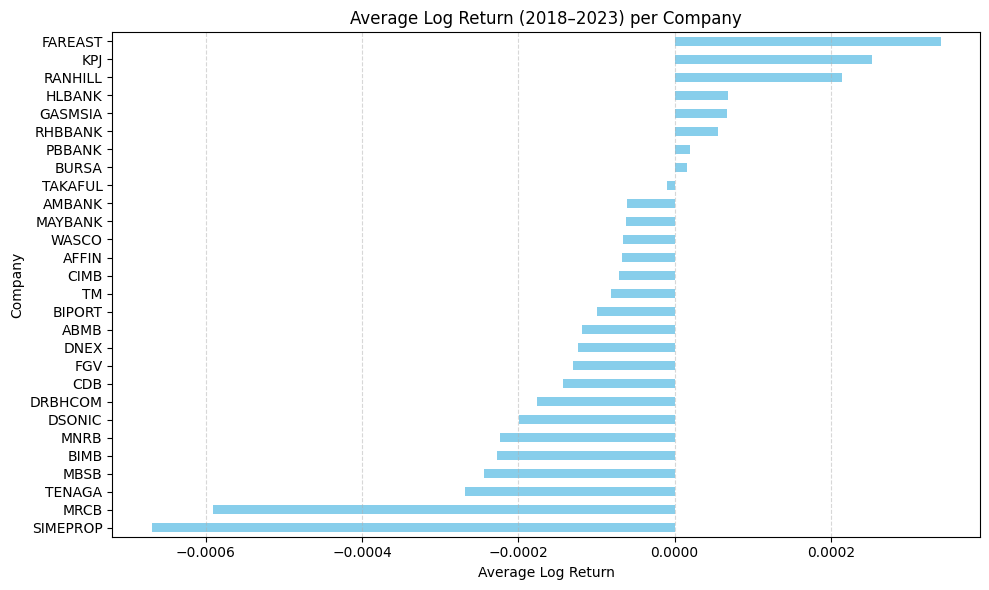

In [43]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# --- Setup data ---
cleaned_PBMZI['Date'] = pd.to_datetime(cleaned_PBMZI['Date'])
cleaned_list = cleaned_PBMZI.columns.drop('Date')

# Log return
log_return_df = pd.concat([
    cleaned_PBMZI[['Date']],
    cleaned_PBMZI[cleaned_list].apply(lambda col: np.log(col / col.shift(1)))
], axis=1)

log_return_df = log_return_df.dropna()

# Kira purata setiap syarikat sepanjang 2018–2023
avg_return_all_years = log_return_df[cleaned_list].mean().sort_values()

# Plot
plt.figure(figsize=(10, 6))
avg_return_all_years.plot(kind='barh', color='skyblue')
plt.title('Average Log Return (2018–2023) per Company')
plt.xlabel('Average Log Return')
plt.ylabel('Company')
plt.grid(True, axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


##5.4 Average of Log Return Year by Year

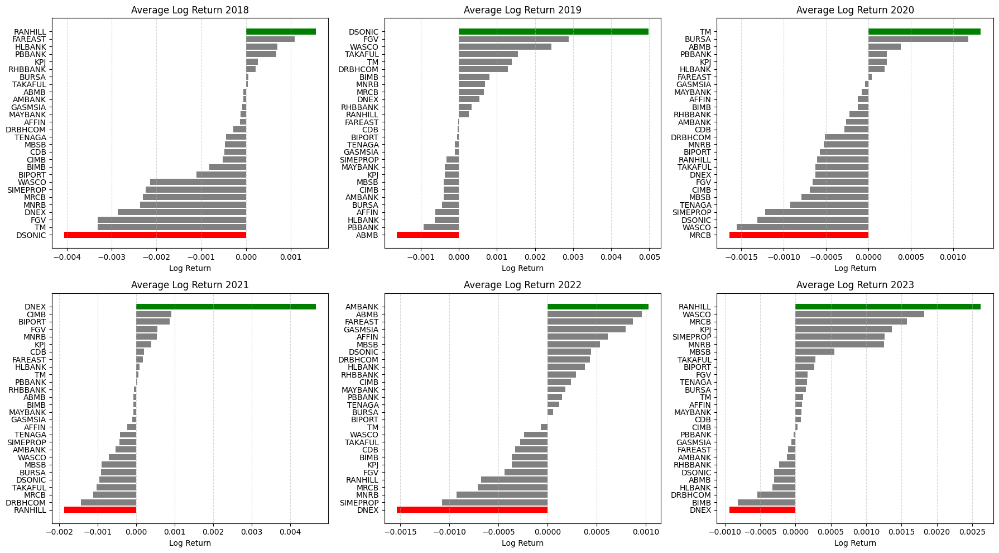

In [44]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# --- Setup data ---
cleaned_PBMZI['Date'] = pd.to_datetime(cleaned_PBMZI['Date'])
cleaned_list = cleaned_PBMZI.columns.drop('Date')

# Log return
log_return_df = pd.concat([
    cleaned_PBMZI[['Date']],
    cleaned_PBMZI[cleaned_list].apply(lambda col: np.log(col / col.shift(1)))
], axis=1)

log_return_df['Year'] = log_return_df['Date'].dt.year
log_return_df = log_return_df.dropna()

# Purata setiap tahun bagi setiap syarikat
avg_return_each_year = log_return_df.groupby('Year')[cleaned_list].mean()

# Setup grid 2x3
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for i, year in enumerate(avg_return_each_year.index):
    avg_values = avg_return_each_year.loc[year].sort_values()
    colors = ['red' if val == avg_values.min() else
              'green' if val == avg_values.max() else
              'gray' for val in avg_values]

    axes[i].barh(avg_values.index, avg_values.values, color=colors)
    axes[i].set_title(f'Average Log Return {year}')
    axes[i].set_xlabel('Log Return')
    axes[i].grid(True, axis='x', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()


##5.5 Std of Log Return 2018-2023

In [45]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Pastikan tarikh dalam format datetime
cleaned_PBMZI['Date'] = pd.to_datetime(cleaned_PBMZI['Date'])

# Senarai nama syarikat (exclude 'date')
cleaned_list = cleaned_PBMZI.columns.drop('Date')

# Buat log return dan gabungkan dengan date
log_return_df = pd.concat([
    cleaned_PBMZI[['Date']],
    cleaned_PBMZI[cleaned_list].apply(lambda col: np.log(col / col.shift(1)))
], axis=1)

# Tambah kolum tahun
log_return_df['Year'] = log_return_df['Date'].dt.year

# Buang NaN sebab shift(1)
log_return_df = log_return_df.dropna()

# Group by tahun dan kira standard deviation bagi setiap syarikat
std_return_by_year = log_return_df.groupby('Year')[cleaned_list].std()

# Kira purata standard deviation untuk semua syarikat setiap tahun
std_return_by_year['STD of log return'] = std_return_by_year.mean(axis=1)

# Reset index untuk jadi DataFrame biasa
final_std_return = std_return_by_year[['STD of log return']].reset_index()

# Papar hasil
print(final_std_return)


   Year  STD of log return
0  2018           0.019687
1  2019           0.015518
2  2020           0.024578
3  2021           0.015905
4  2022           0.016173
5  2023           0.013486


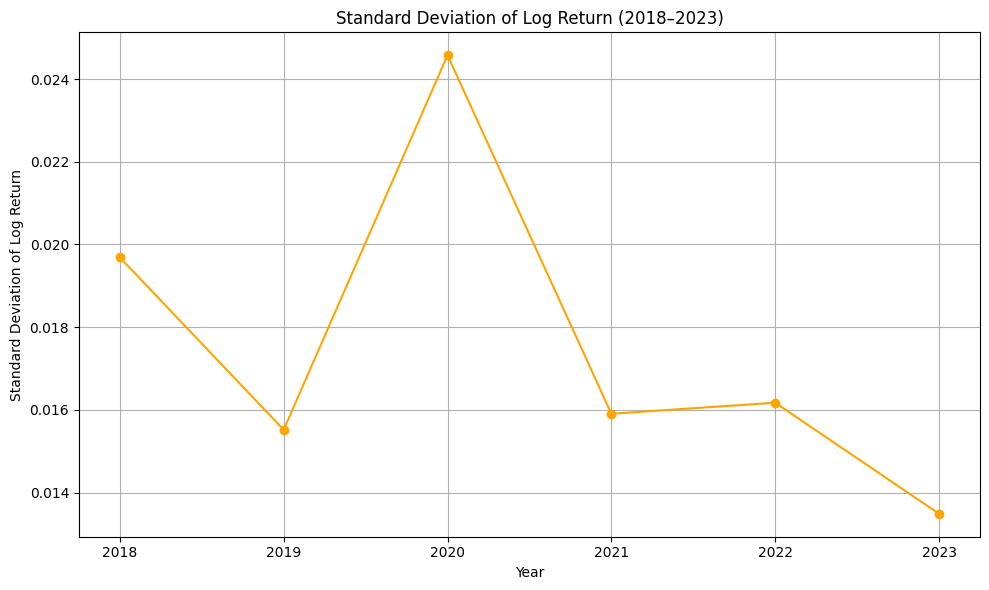

In [46]:
plt.figure(figsize=(10, 6))

# Plot graf garis
plt.plot(final_std_return['Year'], final_std_return['STD of log return'], marker='o', linestyle='-', color='orange')

# Hiasan graf
plt.title('Standard Deviation of Log Return (2018–2023)')
plt.xlabel('Year')
plt.ylabel('Standard Deviation of Log Return')
plt.grid(True)
plt.xticks(final_std_return['Year'])  # pastikan semua tahun muncul
plt.tight_layout()

# Papar graf
plt.show()


##5.6 Std of Log Return acros 2018-2023

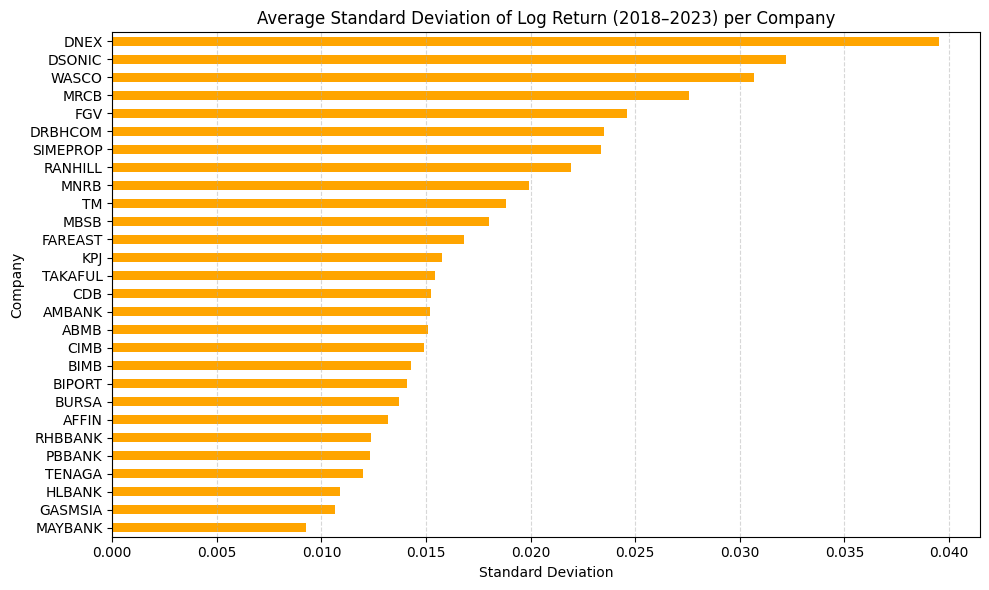

In [47]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# --- Step 1: Kira log return ---
cleaned_PBMZI['Date'] = pd.to_datetime(cleaned_PBMZI['Date'])
cleaned_list = cleaned_PBMZI.columns.drop('Date')

log_return_df = pd.concat([
    cleaned_PBMZI[['Date']],
    cleaned_PBMZI[cleaned_list].apply(lambda col: np.log(col / col.shift(1)))
], axis=1)

log_return_df['Year'] = log_return_df['Date'].dt.year
log_return_df = log_return_df.dropna()

# --- Step 2: Kira standard deviation purata (2018–2023) setiap syarikat ---
std_return_all_years = log_return_df[cleaned_list].std().sort_values()

# --- Step 3: Plot Horizontal Bar Chart ---
plt.figure(figsize=(10, 6))
std_return_all_years.plot(kind='barh', color='orange')
plt.title('Average Standard Deviation of Log Return (2018–2023) per Company')
plt.xlabel('Standard Deviation')
plt.ylabel('Company')
plt.grid(True, axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


##5.7 Std of  Log Return Year by Year

In [48]:
log_return_df.columns

Index(['Date', 'AFFIN', 'ABMB', 'AMBANK', 'BIMB', 'BIPORT', 'BURSA', 'CDB',
       'CIMB', 'DNEX', 'DSONIC', 'DRBHCOM', 'FAREAST', 'FGV', 'GASMSIA',
       'HLBANK', 'KPJ', 'MAYBANK', 'MRCB', 'MBSB', 'MNRB', 'PBBANK', 'RANHILL',
       'RHBBANK', 'SIMEPROP', 'TAKAFUL', 'TM', 'TENAGA', 'WASCO', 'Year'],
      dtype='object')

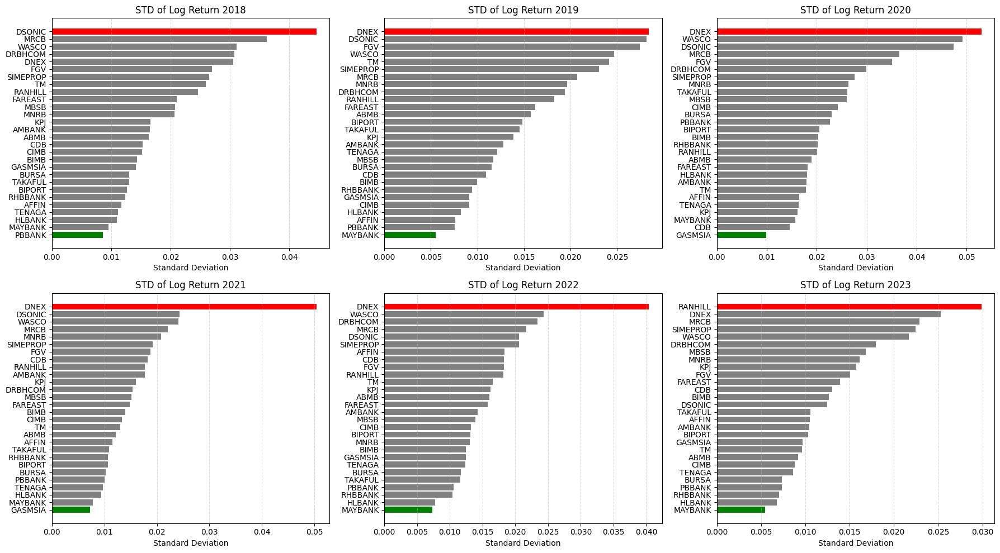

In [49]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# --- Step 1: Kira log return ---
cleaned_PBMZI['Date'] = pd.to_datetime(cleaned_PBMZI['Date'])
cleaned_list = cleaned_PBMZI.columns.drop('Date')

log_return_df = pd.concat([
    cleaned_PBMZI[['Date']],
    cleaned_PBMZI[cleaned_list].apply(lambda col: np.log(col / col.shift(1)))
], axis=1)

log_return_df['Year'] = log_return_df['Date'].dt.year
log_return_df = log_return_df.dropna()

# --- Step 2: Kira standard deviation per company per year ---
std_return_each_year = log_return_df.groupby('Year')[cleaned_list].std()

# --- Step 3: Plot 2×3 grid barh chart dengan color coding ---
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for i, year in enumerate(std_return_each_year.index):
    std_values = std_return_each_year.loc[year].sort_values()
    colors = ['green' if val == std_values.min()
              else 'red' if val == std_values.max()
              else 'gray' for val in std_values]

    axes[i].barh(std_values.index, std_values.values, color=colors)
    axes[i].set_title(f'STD of Log Return {year}')
    axes[i].set_xlabel('Standard Deviation')
    axes[i].grid(True, axis='x', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()


#6. Minimum Spanning Tree

##6.1 MST for PBMZI 2018-2023

/tmp/ipython-input-2912841268.py:41: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("summer_r")


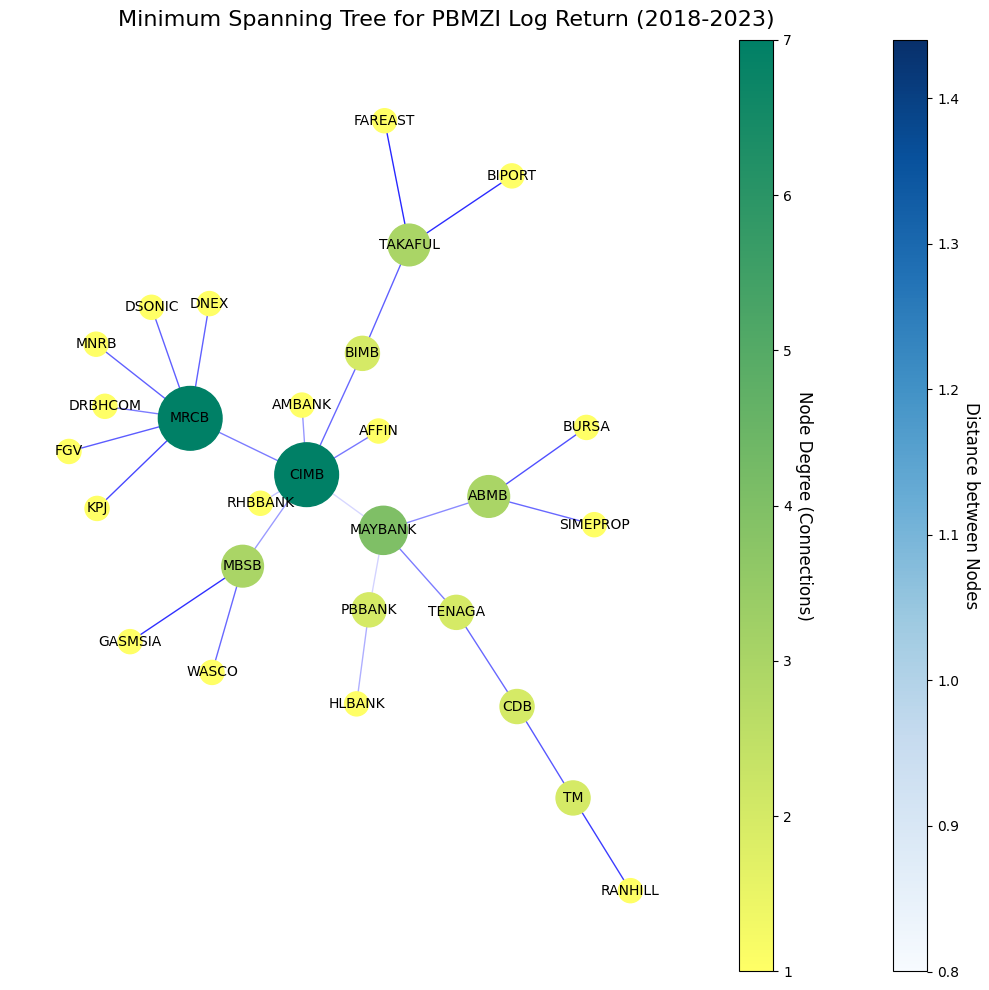

In [50]:
import matplotlib.cm as cm
import matplotlib.colors as mcolors
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Calculate log returns
row1, column1 = cleaned_PBMZI.shape
returns = np.log(cleaned_PBMZI.iloc[1:row1, 1:column1].values /cleaned_PBMZI.iloc[0:row1-1, 1:column1].values)

returns_df = pd.DataFrame(returns, columns=cleaned_PBMZI.columns[1:])

# 3. Correlation matrix
corremat = np.corrcoef(returns_df.T)  # Pearson correlation

# 4. Distance matrix
distmat = np.round(np.sqrt(2 * (1 - corremat)),2) # Rounded to 2 decimal places for labels

# 5. Kruskal Algorithm to create MST
# Create adjacency graph
companies = returns_df.columns.tolist()
G = nx.Graph()

# Add nodes
G.add_nodes_from(companies)

# Add weighted edges (distance matrix)
for i in range(len(companies)):
    for j in range(i+1, len(companies)):
        G.add_edge(companies[i], companies[j], weight=distmat[i, j])

# Simplify graph (networkx handles duplicate edges automatically)

# Create MST
MST_PBMZI = nx.minimum_spanning_tree(G, weight="weight", algorithm="kruskal")

# Calculate a measure for coloring (degree centrality)
node_values = dict(MST_PBMZI.degree())  # you can use nx.degree_centrality, nx.closeness_centrality, etc.
values = np.array(list(node_values.values()))

# Normalize values to [0,1] for colormap
norm_nodes = mcolors.Normalize(vmin=values.min(), vmax=values.max())
cmap = cm.get_cmap("summer_r")

# Map each node to a color
node_colors = [cmap(norm_nodes(val)) for val in values]

# Get node degrees (number of connections per node)
degrees = dict(MST_PBMZI.degree())
# Scale them so sizes are visible (otherwise too small)
node_sizes = [v * 300 for v in degrees.values()]

# Get edge weights
weights = nx.get_edge_attributes(MST_PBMZI, "weight").values()
# Normalize weights to [0,1]
norm = mcolors.Normalize(vmin=min(weights)-0.1, vmax=max(weights)+0.1)
# Map weights to opacity (alpha), fixed blue color
edge_colors = [(0, 0, 1, norm(w)) for w in weights]
# (R,G,B,alpha) → here alpha decreases as weight increases
sm_edges = cm.ScalarMappable(cmap=cm.Blues, norm=norm)
sm_edges.set_array([])

# Plot MST
fig, ax = plt.subplots(figsize=(10, 10)) # Get figure and axes
pos=nx.kamada_kawai_layout(MST_PBMZI)
nx.draw(MST_PBMZI, pos,
        with_labels=True,
        node_color=node_colors,  # Use the list of calculated colors
        node_size=node_sizes,
        font_size=10, # Increased font size
        font_color="black",
        edge_color=edge_colors, # Fixed edge color
         # Use calculated edge widths
        ax=ax) # Specify the axes

# Add colorbar legend using make_axes_locatable
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.5)
sm = cm.ScalarMappable(cmap=cmap, norm=norm_nodes)
sm.set_array([])
cbar = fig.colorbar(sm, cax=cax)
cbar.set_label("Node Degree (Connections)", rotation=270, labelpad=15, fontsize=12) # Increased label font size

cax2 = divider.append_axes("right", size="5%", pad=1.2)   # letak tepi kanan
cbar_edges = fig.colorbar(sm_edges, cax=cax2)
cbar_edges.set_label("Distance between Nodes", rotation=270, labelpad=15, fontsize=12)

plt.title("Minimum Spanning Tree for PBMZI Log Return (2018-2023)",size=16, loc='right', pad=10, x=-3.5)
plt.tight_layout()
plt.show()

##6.2 MST for PBMZI 2018

/tmp/ipython-input-2730687566.py:45: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("summer_r")


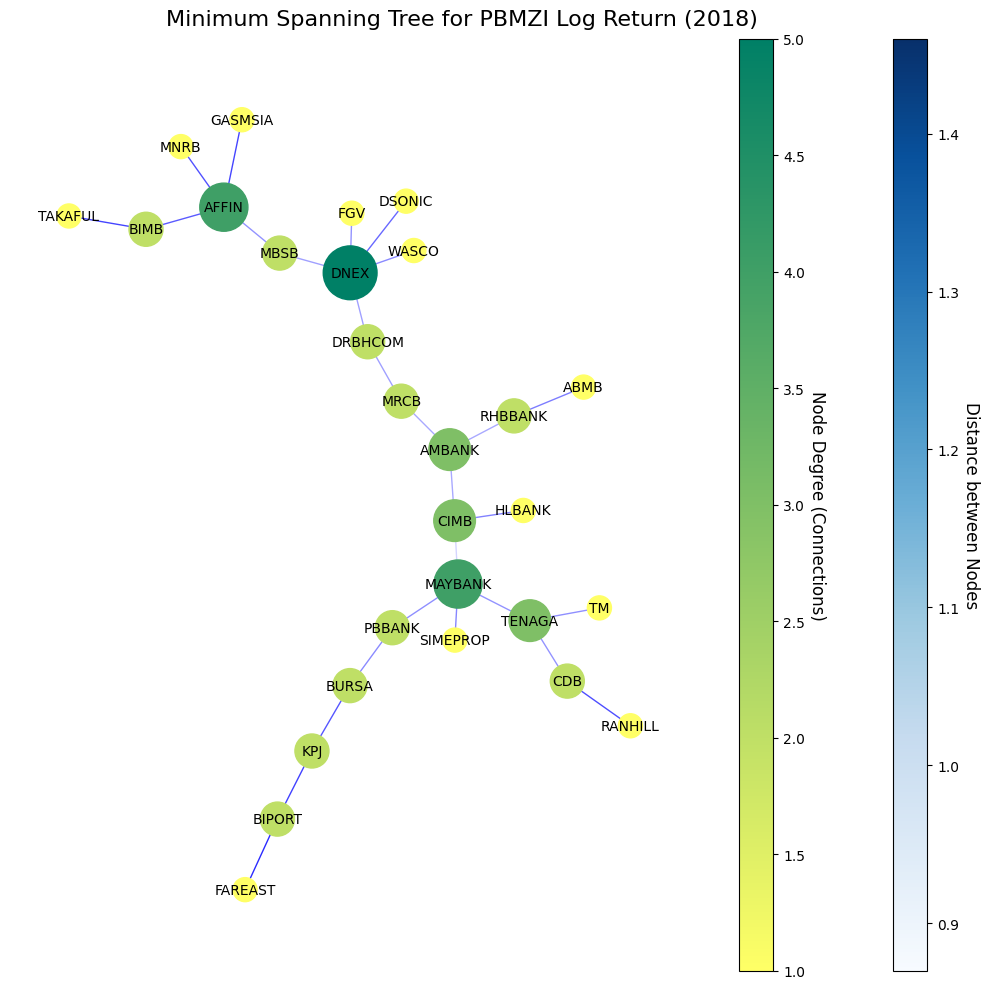

In [51]:
import matplotlib.cm as cm
import matplotlib.colors as mcolors
from mpl_toolkits.axes_grid1 import make_axes_locatable

# select only data for the specified year
cleaned_PBMZI_2018 = cleaned_PBMZI[cleaned_PBMZI["Date"].dt.year == 2018].reset_index(drop=True)

# Calculate log returns for that year only
row1, column1 = cleaned_PBMZI_2018.shape
returns_2018 = np.log(cleaned_PBMZI_2018.iloc[1:row1, 1:column1].values / cleaned_PBMZI_2018.iloc[0:row1-1, 1:column1].values)

# Create a DataFrame from the returns, preserving column names
returns_2018 = pd.DataFrame(returns_2018, columns=cleaned_PBMZI_2018.columns[1:])

# 3. Correlation matrix
corremat = np.corrcoef(returns_2018.T)  # Pearson correlation

# 4. Distance matrix
distmat = np.round(np.sqrt(2 * (1 - corremat)),2) # Rounded to 2 decimal places for labels

# 5. Kruskal Algorithm to create MST
# Create adjacency graph
companies = returns_2018.columns.tolist()
G = nx.Graph()

# Add nodes
G.add_nodes_from(companies)

# Add weighted edges (distance matrix)
for i in range(len(companies)):
    for j in range(i+1, len(companies)):
        G.add_edge(companies[i], companies[j], weight=distmat[i, j])

# Simplify graph (networkx handles duplicate edges automatically)

# Create MST
MST_PBMZI_2018 = nx.minimum_spanning_tree(G, weight="weight", algorithm="kruskal")

# Calculate a measure for coloring (degree centrality)
node_values = dict(MST_PBMZI_2018.degree())  # you can use nx.degree_centrality, nx.closeness_centrality, etc.
values = np.array(list(node_values.values()))

# Normalize values to [0,1] for colormap
norm_nodes = mcolors.Normalize(vmin=values.min(), vmax=values.max())
cmap = cm.get_cmap("summer_r")

# Map each node to a color
node_colors = [cmap(norm_nodes(val)) for val in values]

# Get node degrees (number of connections per node)
degrees = dict(MST_PBMZI_2018.degree())
# Scale them so sizes are visible (otherwise too small)
node_sizes = [v * 300 for v in degrees.values()]

# Get edge weights
weights = nx.get_edge_attributes(MST_PBMZI_2018, "weight").values()
# Normalize weights to [0,1]
norm = mcolors.Normalize(vmin=min(weights)-0.1, vmax=max(weights)+0.1)
# Map weights to opacity (alpha), fixed blue color
edge_colors = [(0, 0, 1, norm(w)) for w in weights]
# (R,G,B,alpha) → here alpha decreases as weight increases
sm_edges = cm.ScalarMappable(cmap=cm.Blues, norm=norm)
sm_edges.set_array([])

# Plot MST
fig, ax = plt.subplots(figsize=(10, 10)) # Get figure and axes
pos=nx.kamada_kawai_layout(MST_PBMZI_2018)
nx.draw(MST_PBMZI_2018, pos,
        with_labels=True,
        node_color=node_colors,  # Use the list of calculated colors
        node_size=node_sizes,
        font_size=10, # Increased font size
        font_color="black",
        edge_color=edge_colors, # Fixed edge color
         # Use calculated edge widths
        ax=ax) # Specify the axes

# Add colorbar legend using make_axes_locatable
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.5)
sm = cm.ScalarMappable(cmap=cmap, norm=norm_nodes)
sm.set_array([])
cbar = fig.colorbar(sm, cax=cax)
cbar.set_label("Node Degree (Connections)", rotation=270, labelpad=15, fontsize=12) # Increased label font size

cax2 = divider.append_axes("right", size="5%", pad=1.2)   # letak tepi kanan
cbar_edges = fig.colorbar(sm_edges, cax=cax2)
cbar_edges.set_label("Distance between Nodes", rotation=270, labelpad=15, fontsize=12)

plt.title("Minimum Spanning Tree for PBMZI Log Return (2018)",size=16, loc='right', pad=10, x=-4)
plt.tight_layout()
plt.show()

##6.3 MST for PBMZI 2019

/tmp/ipython-input-2777874407.py:45: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("summer_r")


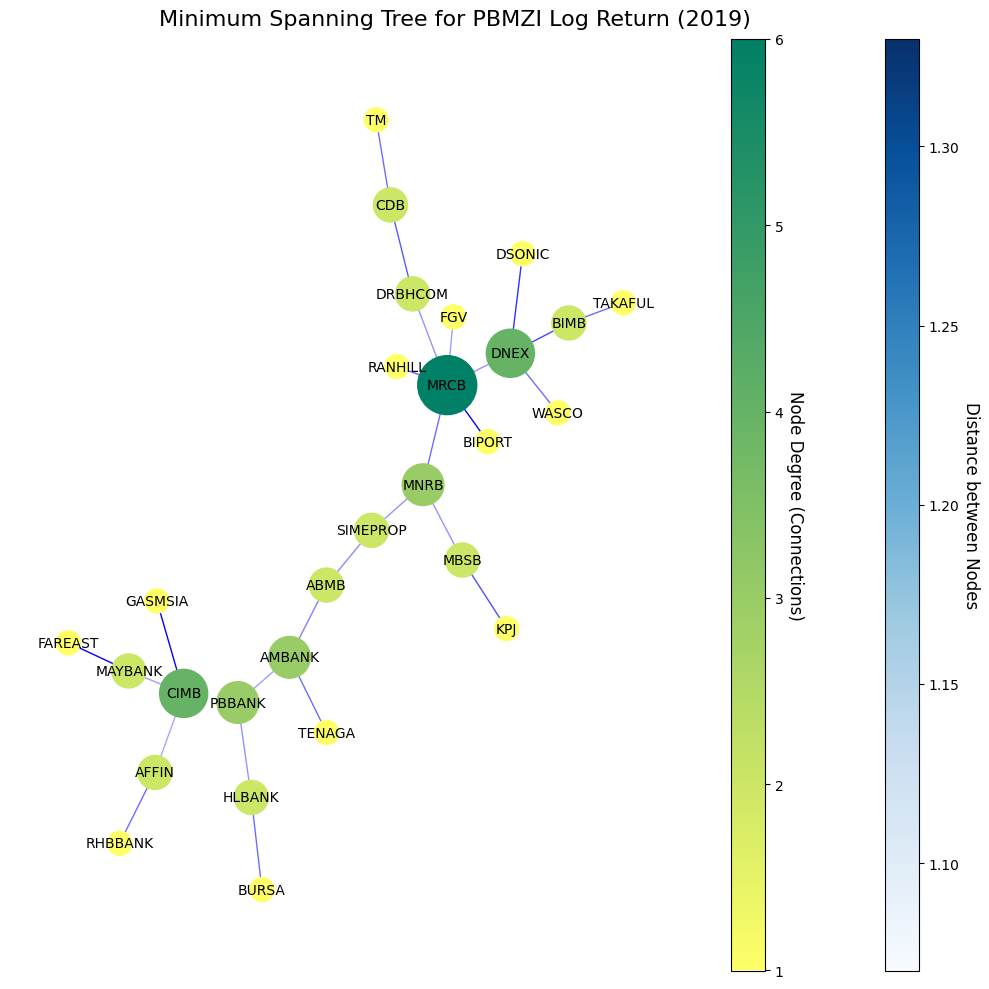

In [52]:
import matplotlib.cm as cm
import matplotlib.colors as mcolors
from mpl_toolkits.axes_grid1 import make_axes_locatable

# select only data for the specified year
cleaned_PBMZI_2019 = cleaned_PBMZI[cleaned_PBMZI["Date"].dt.year == 2019].reset_index(drop=True)

# Calculate log returns for that year only
row1, column1 = cleaned_PBMZI_2019.shape
returns_2019 = np.log(cleaned_PBMZI_2019.iloc[1:row1, 1:column1].values / cleaned_PBMZI_2019.iloc[0:row1-1, 1:column1].values)

# Create a DataFrame from the returns, preserving column names
returns_2019 = pd.DataFrame(returns_2019, columns=cleaned_PBMZI_2019.columns[1:])

# 3. Correlation matrix
corremat = np.corrcoef(returns_2019.T)  # Pearson correlation

# 4. Distance matrix
distmat = np.round(np.sqrt(2 * (1 - corremat)),2) # Rounded to 2 decimal places for labels

# 5. Kruskal Algorithm to create MST
# Create adjacency graph
companies = returns_2019.columns.tolist()
G = nx.Graph()

# Add nodes
G.add_nodes_from(companies)

# Add weighted edges (distance matrix)
for i in range(len(companies)):
    for j in range(i+1, len(companies)):
        G.add_edge(companies[i], companies[j], weight=distmat[i, j])

# Simplify graph (networkx handles duplicate edges automatically)

# Create MST
MST_PBMZI_2019 = nx.minimum_spanning_tree(G, weight="weight", algorithm="kruskal")

# Calculate a measure for coloring (degree centrality)
node_values = dict(MST_PBMZI_2019.degree())  # you can use nx.degree_centrality, nx.closeness_centrality, etc.
values = np.array(list(node_values.values()))

# Normalize values to [0,1] for colormap
norm_nodes = mcolors.Normalize(vmin=values.min(), vmax=values.max())
cmap = cm.get_cmap("summer_r")

# Map each node to a color
node_colors = [cmap(norm_nodes(val)) for val in values]

# Get node degrees (number of connections per node)
degrees = dict(MST_PBMZI_2019.degree())
# Scale them so sizes are visible (otherwise too small)
node_sizes = [v * 300 for v in degrees.values()]

# Get edge weights
weights = nx.get_edge_attributes(MST_PBMZI_2019, "weight").values()
# Normalize weights to [0,1]
norm = mcolors.Normalize(vmin=min(weights), vmax=max(weights))
# Map weights to opacity (alpha), fixed blue color
edge_colors = [(0, 0, 1, norm(w)) for w in weights]
# (R,G,B,alpha) → here alpha decreases as weight increases
sm_edges = cm.ScalarMappable(cmap=cm.Blues, norm=norm)
sm_edges.set_array([])

# Plot MST
fig, ax = plt.subplots(figsize=(10, 10)) # Get figure and axes
pos = nx.kamada_kawai_layout(MST_PBMZI_2019)
nx.draw(MST_PBMZI_2019, pos,
        with_labels=True,
        node_color=node_colors,  # Use the list of calculated colors
        node_size=node_sizes,
        font_size=10, # Increased font size
        font_color="black",
        edge_color=edge_colors, # Fixed edge color
         # Use calculated edge widths
        ax=ax) # Specify the axes

# Add colorbar legend using make_axes_locatable
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.5)
sm = cm.ScalarMappable(cmap=cmap, norm=norm_nodes)
sm.set_array([])
cbar = fig.colorbar(sm, cax=cax)
cbar.set_label("Node Degree (Connections)", rotation=270, labelpad=15, fontsize=12) # Increased label font size

cax2 = divider.append_axes("right", size="5%", pad=1.2)   # letak tepi kanan
cbar_edges = fig.colorbar(sm_edges, cax=cax2)
cbar_edges.set_label("Distance between Nodes", rotation=270, labelpad=15, fontsize=12)

plt.title("Minimum Spanning Tree for PBMZI Log Return (2019)",size=16, loc='right', pad=10, x=-4)
plt.tight_layout()
plt.show()

##6.4 MST for PBMZI 2020

/tmp/ipython-input-3485356983.py:45: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("summer_r")


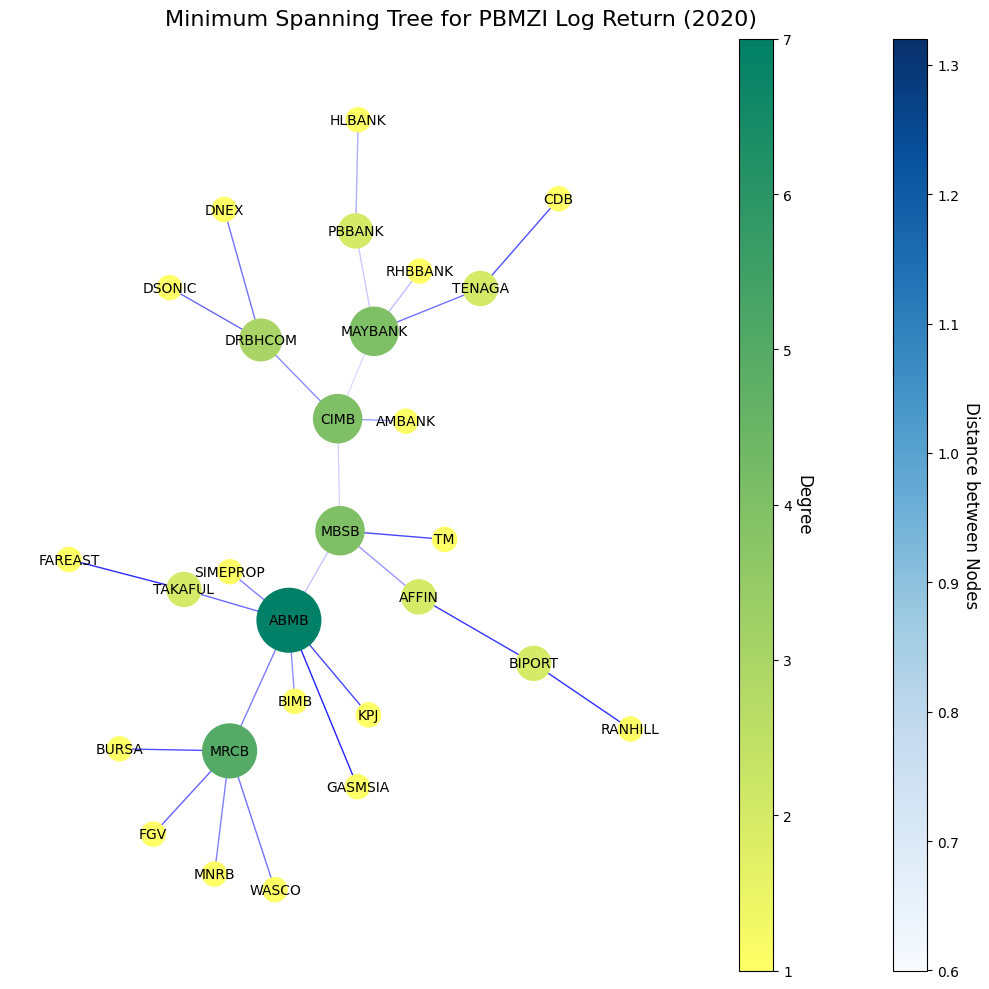

In [53]:
import matplotlib.cm as cm
import matplotlib.colors as mcolors
from mpl_toolkits.axes_grid1 import make_axes_locatable

# select only data for the specified year
cleaned_PBMZI_2020 = cleaned_PBMZI[cleaned_PBMZI["Date"].dt.year == 2020].reset_index(drop=True)

# Calculate log returns for that year only
row1, column1 = cleaned_PBMZI_2020.shape
returns_2020 = np.log(cleaned_PBMZI_2020.iloc[1:row1, 1:column1].values / cleaned_PBMZI_2020.iloc[0:row1-1, 1:column1].values)

# Create a DataFrame from the returns, preserving column names
returns_2020 = pd.DataFrame(returns_2020, columns=cleaned_PBMZI_2020.columns[1:])

# 3. Correlation matrix
corremat = np.corrcoef(returns_2020.T)  # Pearson correlation

# 4. Distance matrix
distmat = np.round(np.sqrt(2 * (1 - corremat)),2) # Rounded to 2 decimal places for labels

# 5. Kruskal Algorithm to create MST
# Create adjacency graph
companies = returns_2020.columns.tolist()
G = nx.Graph()

# Add nodes
G.add_nodes_from(companies)

# Add weighted edges (distance matrix)
for i in range(len(companies)):
    for j in range(i+1, len(companies)):
        G.add_edge(companies[i], companies[j], weight=distmat[i, j])

# Simplify graph (networkx handles duplicate edges automatically)

# Create MST
MST_PBMZI_2020 = nx.minimum_spanning_tree(G, weight="weight", algorithm="kruskal")

# Calculate a measure for coloring (degree centrality)
node_values = dict(MST_PBMZI_2020.degree())  # you can use nx.degree_centrality, nx.closeness_centrality, etc.
values = np.array(list(node_values.values()))

# Normalize values to [0,1] for colormap
norm_nodes = mcolors.Normalize(vmin=values.min(), vmax=values.max())
cmap = cm.get_cmap("summer_r")

# Map each node to a color
node_colors = [cmap(norm_nodes(val)) for val in values]

# Get node degrees (number of connections per node)
degrees = dict(MST_PBMZI_2020.degree())
# Scale them so sizes are visible (otherwise too small)
node_sizes = [v * 300 for v in degrees.values()]

# Get edge weights
weights = nx.get_edge_attributes(MST_PBMZI_2020, "weight").values()
# Normalize weights to [0,1]
norm = mcolors.Normalize(vmin=min(weights)-0.1, vmax=max(weights)+0.1)
# Map weights to opacity (alpha), fixed blue color
edge_colors = [(0, 0, 1, norm(w)) for w in weights]
# (R,G,B,alpha) → here alpha decreases as weight increases
sm_edges = cm.ScalarMappable(cmap=cm.Blues, norm=norm)
sm_edges.set_array([])

# Plot MST
fig, ax = plt.subplots(figsize=(10, 10)) # Get figure and axes
pos = nx.kamada_kawai_layout(MST_PBMZI_2020)
nx.draw(MST_PBMZI_2020, pos,
        with_labels=True,
        node_color=node_colors,  # Use the list of calculated colors
        node_size=node_sizes,
        font_size=10, # Increased font size
        font_color="black",
        edge_color=edge_colors, # Fixed edge color
         # Use calculated edge widths
        ax=ax) # Specify the axes

# Add colorbar legend using make_axes_locatable
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.5)
sm = cm.ScalarMappable(cmap=cmap, norm=norm_nodes)
sm.set_array([])
cbar = fig.colorbar(sm, cax=cax)
cbar.set_label("Degree", rotation=270, labelpad=15, fontsize=12) # Increased label font size

cax2 = divider.append_axes("right", size="5%", pad=1.2)   # letak tepi kanan
cbar_edges = fig.colorbar(sm_edges, cax=cax2)
cbar_edges.set_label("Distance between Nodes", rotation=270, labelpad=15, fontsize=12)

plt.title("Minimum Spanning Tree for PBMZI Log Return (2020)",size=16, loc='right', pad=10, x=-4)
plt.tight_layout()
plt.show()

##6.5 MST for PBMZI 2021

/tmp/ipython-input-3980804553.py:45: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("summer_r")


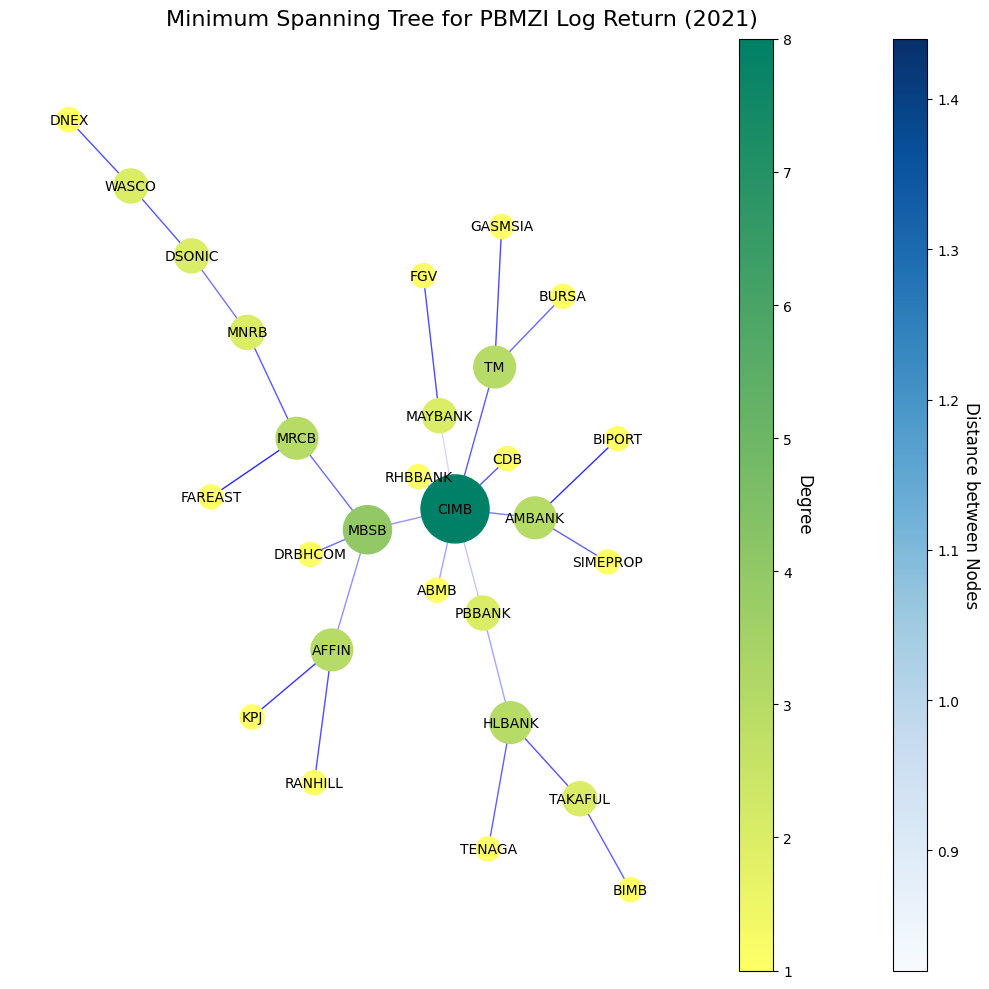

In [54]:
import matplotlib.cm as cm
import matplotlib.colors as mcolors
from mpl_toolkits.axes_grid1 import make_axes_locatable

# select only data for the specified year
cleaned_PBMZI_2021 = cleaned_PBMZI[cleaned_PBMZI["Date"].dt.year == 2021].reset_index(drop=True)

# Calculate log returns for that year only
row1, column1 = cleaned_PBMZI_2021.shape
returns_2021 = np.log(cleaned_PBMZI_2021.iloc[1:row1, 1:column1].values / cleaned_PBMZI_2021.iloc[0:row1-1, 1:column1].values)

# Create a DataFrame from the returns, preserving column names
returns_2021 = pd.DataFrame(returns_2021, columns=cleaned_PBMZI_2021.columns[1:])

# 3. Correlation matrix
corremat = np.corrcoef(returns_2021.T)  # Pearson correlation

# 4. Distance matrix
distmat = np.round(np.sqrt(2 * (1 - corremat)),2) # Rounded to 2 decimal places for labels

# 5. Kruskal Algorithm to create MST
# Create adjacency graph
companies = returns_2021.columns.tolist()
G = nx.Graph()

# Add nodes
G.add_nodes_from(companies)

# Add weighted edges (distance matrix)
for i in range(len(companies)):
    for j in range(i+1, len(companies)):
        G.add_edge(companies[i], companies[j], weight=distmat[i, j])

# Simplify graph (networkx handles duplicate edges automatically)

# Create MST
MST_PBMZI_2021 = nx.minimum_spanning_tree(G, weight="weight", algorithm="kruskal")

# Calculate a measure for coloring (degree centrality)
node_values = dict(MST_PBMZI_2021.degree())  # you can use nx.degree_centrality, nx.closeness_centrality, etc.
values = np.array(list(node_values.values()))

# Normalize values to [0,1] for colormap
norm_nodes = mcolors.Normalize(vmin=values.min(), vmax=values.max())
cmap = cm.get_cmap("summer_r")

# Map each node to a color
node_colors = [cmap(norm_nodes(val)) for val in values]

# Get node degrees (number of connections per node)
degrees = dict(MST_PBMZI_2021.degree())
# Scale them so sizes are visible (otherwise too small)
node_sizes = [v * 300 for v in degrees.values()]

# Get edge weights
weights = nx.get_edge_attributes(MST_PBMZI_2021, "weight").values()
# Normalize weights to [0,1]
norm = mcolors.Normalize(vmin=min(weights)-0.1, vmax=max(weights)+0.1)
# Map weights to opacity (alpha), fixed blue color
edge_colors = [(0, 0, 1, norm(w)) for w in weights]
# (R,G,B,alpha) → here alpha decreases as weight increases
sm_edges = cm.ScalarMappable(cmap=cm.Blues, norm=norm)
sm_edges.set_array([])

# Plot MST
fig, ax = plt.subplots(figsize=(10, 10)) # Get figure and axes
pos = nx.kamada_kawai_layout(MST_PBMZI_2021)
nx.draw(MST_PBMZI_2021, pos,
        with_labels=True,
        node_color=node_colors,  # Use the list of calculated colors
        node_size=node_sizes,
        font_size=10, # Increased font size
        font_color="black",
        edge_color=edge_colors, # Fixed edge color
         # Use calculated edge widths
        ax=ax) # Specify the axes

# Add colorbar legend using make_axes_locatable
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.5)
sm = cm.ScalarMappable(cmap=cmap, norm=norm_nodes)
sm.set_array([])
cbar = fig.colorbar(sm, cax=cax)
cbar.set_label("Degree", rotation=270, labelpad=15, fontsize=12) # Increased label font size

cax2 = divider.append_axes("right", size="5%", pad=1.2)   # letak tepi kanan
cbar_edges = fig.colorbar(sm_edges, cax=cax2)
cbar_edges.set_label("Distance between Nodes", rotation=270, labelpad=15, fontsize=12)

plt.title("Minimum Spanning Tree for PBMZI Log Return (2021)",size=16, loc='right', pad=10, x=-4)
plt.tight_layout()
plt.show()

##6.6 MST for PBMZI 2022

/tmp/ipython-input-208513777.py:45: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("summer_r")


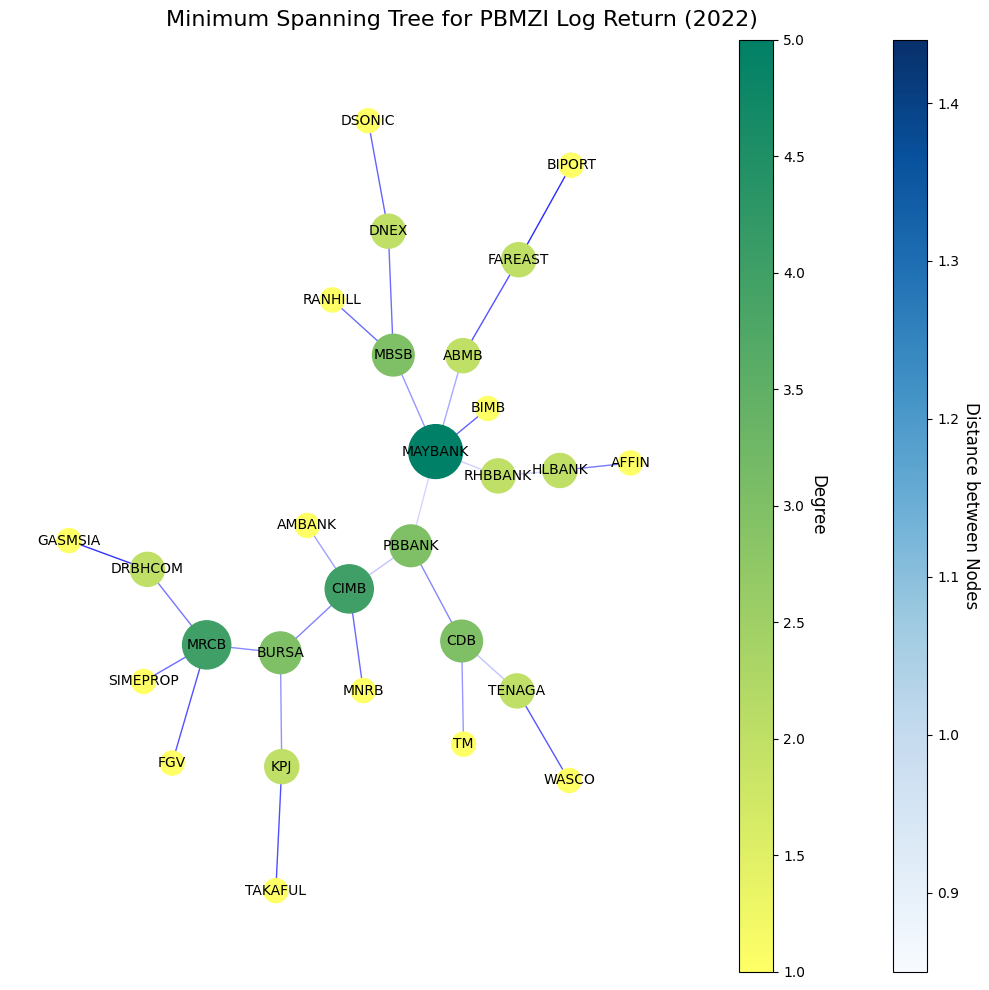

In [55]:
import matplotlib.cm as cm
import matplotlib.colors as mcolors
from mpl_toolkits.axes_grid1 import make_axes_locatable

# select only data for the specified year
cleaned_PBMZI_2022 = cleaned_PBMZI[cleaned_PBMZI["Date"].dt.year == 2022].reset_index(drop=True)

# Calculate log returns for that year only
row1, column1 = cleaned_PBMZI_2022.shape
returns_2022 = np.log(cleaned_PBMZI_2022.iloc[1:row1, 1:column1].values / cleaned_PBMZI_2022.iloc[0:row1-1, 1:column1].values)

# Create a DataFrame from the returns, preserving column names
returns_2022 = pd.DataFrame(returns_2022, columns=cleaned_PBMZI_2022.columns[1:])

# 3. Correlation matrix
corremat = np.corrcoef(returns_2022.T)  # Pearson correlation

# 4. Distance matrix
distmat = np.round(np.sqrt(2 * (1 - corremat)),2) # Rounded to 2 decimal places for labels

# 5. Kruskal Algorithm to create MST
# Create adjacency graph
companies = returns_2022.columns.tolist()
G = nx.Graph()

# Add nodes
G.add_nodes_from(companies)

# Add weighted edges (distance matrix)
for i in range(len(companies)):
    for j in range(i+1, len(companies)):
        G.add_edge(companies[i], companies[j], weight=distmat[i, j])

# Simplify graph (networkx handles duplicate edges automatically)

# Create MST
MST_PBMZI_2022 = nx.minimum_spanning_tree(G, weight="weight", algorithm="kruskal")

# Calculate a measure for coloring (degree centrality)
node_values = dict(MST_PBMZI_2022.degree())  # you can use nx.degree_centrality, nx.closeness_centrality, etc.
values = np.array(list(node_values.values()))

# Normalize values to [0,1] for colormap
norm_nodes = mcolors.Normalize(vmin=values.min(), vmax=values.max())
cmap = cm.get_cmap("summer_r")

# Map each node to a color
node_colors = [cmap(norm_nodes(val)) for val in values]

# Get node degrees (number of connections per node)
degrees = dict(MST_PBMZI_2022.degree())
# Scale them so sizes are visible (otherwise too small)
node_sizes = [v * 300 for v in degrees.values()]

# Get edge weights
weights = nx.get_edge_attributes(MST_PBMZI_2022, "weight").values()
# Normalize weights to [0,1]
norm = mcolors.Normalize(vmin=min(weights)-0.1, vmax=max(weights)+0.1)
# Map weights to opacity (alpha), fixed blue color
edge_colors = [(0, 0, 1, norm(w)) for w in weights]
# (R,G,B,alpha) → here alpha decreases as weight increases
sm_edges = cm.ScalarMappable(cmap=cm.Blues, norm=norm)
sm_edges.set_array([])

# Plot MST
fig, ax = plt.subplots(figsize=(10, 10)) # Get figure and axes
pos = nx.kamada_kawai_layout(MST_PBMZI_2022)
nx.draw(MST_PBMZI_2022, pos,
        with_labels=True,
        node_color=node_colors,  # Use the list of calculated colors
        node_size=node_sizes,
        font_size=10, # Increased font size
        font_color="black",
        edge_color=edge_colors, # Fixed edge color
         # Use calculated edge widths
        ax=ax) # Specify the axes

# Add colorbar legend using make_axes_locatable
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.5)
sm = cm.ScalarMappable(cmap=cmap, norm=norm_nodes)
sm.set_array([])
cbar = fig.colorbar(sm, cax=cax)
cbar.set_label("Degree", rotation=270, labelpad=15, fontsize=12) # Increased label font size

cax2 = divider.append_axes("right", size="5%", pad=1.2)   # letak tepi kanan
cbar_edges = fig.colorbar(sm_edges, cax=cax2)
cbar_edges.set_label("Distance between Nodes", rotation=270, labelpad=15, fontsize=12)

plt.title("Minimum Spanning Tree for PBMZI Log Return (2022)",size=16, loc='right', pad=10, x=-4)
plt.tight_layout()
plt.show()

##6.7 MST for PBMZI 2023

/tmp/ipython-input-1716604674.py:45: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("summer_r")


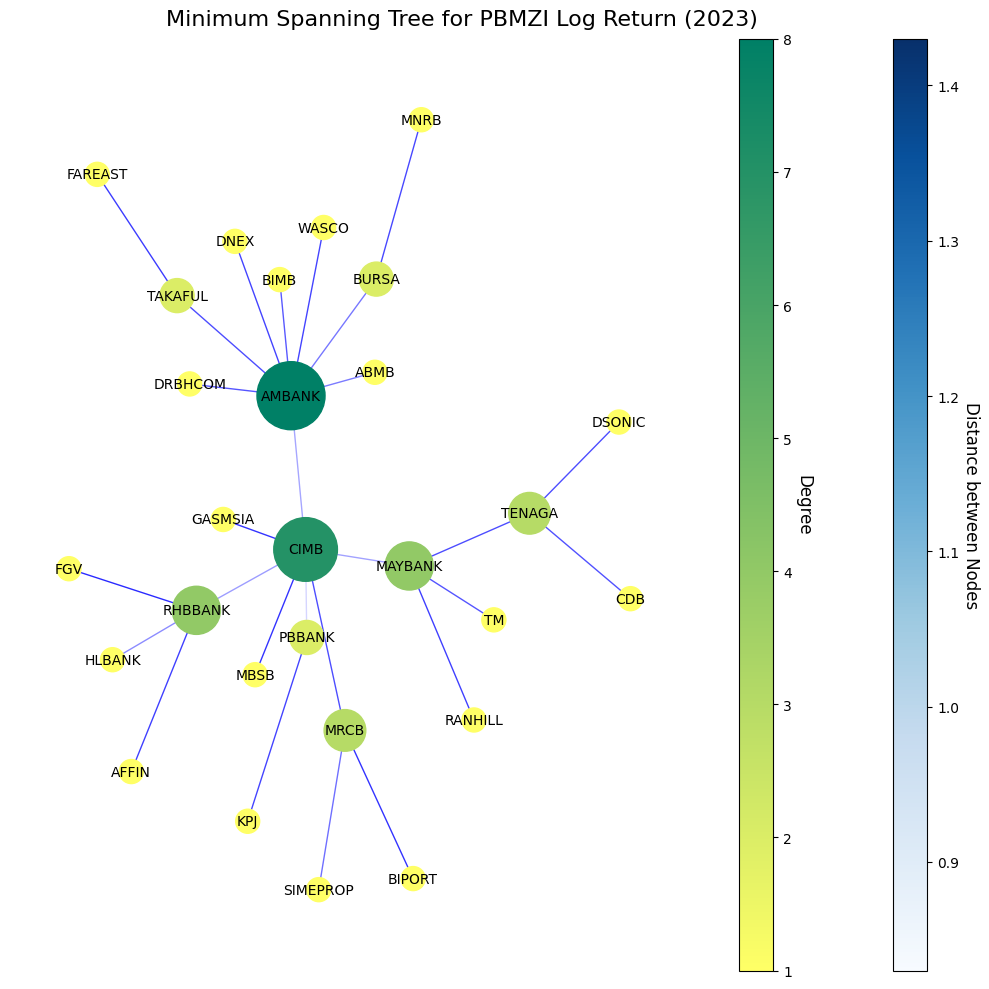

In [56]:
import matplotlib.cm as cm
import matplotlib.colors as mcolors
from mpl_toolkits.axes_grid1 import make_axes_locatable

# select only data for the specified year
cleaned_PBMZI_2023 = cleaned_PBMZI[cleaned_PBMZI["Date"].dt.year == 2023].reset_index(drop=True)

# Calculate log returns for that year only
row1, column1 = cleaned_PBMZI_2023.shape
returns_2023 = np.log(cleaned_PBMZI_2023.iloc[1:row1, 1:column1].values / cleaned_PBMZI_2023.iloc[0:row1-1, 1:column1].values)

# Create a DataFrame from the returns, preserving column names
returns_2023 = pd.DataFrame(returns_2023, columns=cleaned_PBMZI_2023.columns[1:])

# 3. Correlation matrix
corremat = np.corrcoef(returns_2023.T)  # Pearson correlation

# 4. Distance matrix
distmat = np.round(np.sqrt(2 * (1 - corremat)),2) # Rounded to 2 decimal places for labels

# 5. Kruskal Algorithm to create MST
# Create adjacency graph
companies = returns_2023.columns.tolist()
G = nx.Graph()

# Add nodes
G.add_nodes_from(companies)

# Add weighted edges (distance matrix)
for i in range(len(companies)):
    for j in range(i+1, len(companies)):
        G.add_edge(companies[i], companies[j], weight=distmat[i, j])

# Simplify graph (networkx handles duplicate edges automatically)

# Create MST
MST_PBMZI_2023 = nx.minimum_spanning_tree(G, weight="weight", algorithm="kruskal")

# Calculate a measure for coloring (degree centrality)
node_values = dict(MST_PBMZI_2023.degree())  # you can use nx.degree_centrality, nx.closeness_centrality, etc.
values = np.array(list(node_values.values()))

# Normalize values to [0,1] for colormap
norm_nodes = mcolors.Normalize(vmin=values.min(), vmax=values.max())
cmap = cm.get_cmap("summer_r")

# Map each node to a color
node_colors = [cmap(norm_nodes(val)) for val in values]

# Get node degrees (number of connections per node)
degrees = dict(MST_PBMZI_2023.degree())
# Scale them so sizes are visible (otherwise too small)
node_sizes = [v * 300 for v in degrees.values()]

# Get edge weights
weights = nx.get_edge_attributes(MST_PBMZI_2023, "weight").values()
# Normalize weights to [0,1]
norm = mcolors.Normalize(vmin=min(weights)-0.1, vmax=max(weights)+0.1)
# Map weights to opacity (alpha), fixed blue color
edge_colors = [(0, 0, 1, norm(w)) for w in weights]
# (R,G,B,alpha) → here alpha decreases as weight increases
sm_edges = cm.ScalarMappable(cmap=cm.Blues, norm=norm)
sm_edges.set_array([])

# Plot MST
fig, ax = plt.subplots(figsize=(10, 10)) # Get figure and axes
pos = nx.kamada_kawai_layout(MST_PBMZI_2023)
nx.draw(MST_PBMZI_2023, pos,
        with_labels=True,
        node_color=node_colors,  # Use the list of calculated colors
        node_size=node_sizes,
        font_size=10, # Increased font size
        font_color="black",
        edge_color=edge_colors, # Fixed edge color
         # Use calculated edge widths
        ax=ax) # Specify the axes

# Add colorbar legend using make_axes_locatable
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.5)
sm = cm.ScalarMappable(cmap=cmap, norm=norm_nodes)
sm.set_array([])
cbar = fig.colorbar(sm, cax=cax)
cbar.set_label("Degree", rotation=270, labelpad=15, fontsize=12) # Increased label font size

cax2 = divider.append_axes("right", size="5%", pad=1.2)   # letak tepi kanan
cbar_edges = fig.colorbar(sm_edges, cax=cax2)
cbar_edges.set_label("Distance between Nodes", rotation=270, labelpad=15, fontsize=12)

plt.title("Minimum Spanning Tree for PBMZI Log Return (2023)",size=16, loc='right', pad=10, x=-4)
plt.tight_layout()
plt.show()

##6.8 MST Comparison

/tmp/ipython-input-4183983058.py:29: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  node_cmap = cm.get_cmap("summer_r")
/tmp/ipython-input-4183983058.py:36: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  edge_cmap=cm.get_cmap("Blues")
/tmp/ipython-input-4183983058.py:41: UserWarning: 

The connectionstyle keyword argument is not applicable when drawing edges
with LineCollection.

To make this warning go away, either specify `arrows=True` to
force FancyArrowPatches or use the default values.
Note that using FancyArrowPatches may be slow for large graphs.

  nx.draw_networkx_edges(G, pos, edge_color=edge_colors,
/tmp/ipython-input-418398305

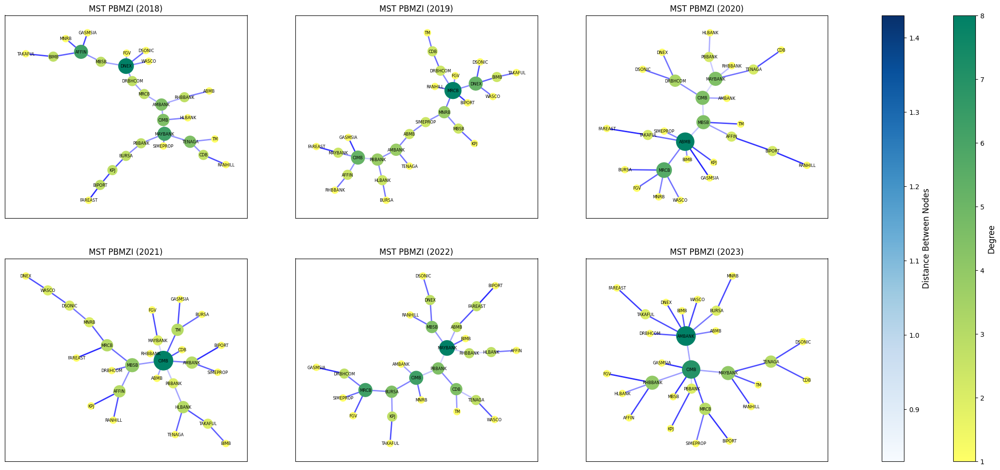

In [57]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import networkx as nx

# Dictionary of all MSTs
mst_dict = {
    "2018": MST_PBMZI_2018,
    "2019": MST_PBMZI_2019,
    "2020": MST_PBMZI_2020,
    "2021": MST_PBMZI_2021,
    "2022": MST_PBMZI_2022,
    "2023": MST_PBMZI_2023,
}

# Setup subplots
fig, axes = plt.subplots(2, 3, figsize=(26, 12))
axes = axes.flatten()

# Plot each MST
for i, (title, G) in enumerate(mst_dict.items()):
    ax = axes[i]

    # Node size & color by degree
    degrees = dict(G.degree())
    values = np.array(list(degrees.values()))
    node_sizes = [v * 100 for v in values]
    norm_node = mcolors.Normalize(vmin=values.min(), vmax=values.max())
    node_cmap = cm.get_cmap("summer_r")
    node_colors = [node_cmap(norm_node(v)) for v in values]

    # Edge transparency by weight
    weights = list(nx.get_edge_attributes(G, "weight").values())
    norm_edge = mcolors.Normalize(vmin=min(weights)-0.1, vmax=max(weights)+0.1)
    edge_colors = [(0, 0, 1, norm_edge(w)) for w in weights]
    edge_cmap=cm.get_cmap("Blues")
    # Layout
    pos = nx.kamada_kawai_layout(G, scale=5)

    # Draw
    nx.draw_networkx_edges(G, pos, edge_color=edge_colors,
                           width=2, connectionstyle="arc3,rad=0.2", ax=ax)
    nx.draw_networkx_nodes(G, pos, node_size=node_sizes,
                           node_color=node_colors, ax=ax)
    nx.draw_networkx_labels(G, pos, font_size=6, font_color="black", ax=ax)
    ax.set_title(f"MST PBMZI ({title})", fontsize=12)

# Kosongkan subplot terakhir kalau tak guna (kalau 2x4 tapi ada 7 je)
if len(mst_dict) < len(axes):
    for j in range(len(mst_dict), len(axes)):
        axes[j].axis("off")
sm_nodes = cm.ScalarMappable(cmap=node_cmap, norm=norm_node)
sm_nodes.set_array([])
cbar_nodes = fig.colorbar(sm_nodes, ax=axes, orientation="vertical",
                          fraction=0.025, pad=0.05)
cbar_nodes.set_label("Degree", fontsize=12)

sm_edges = cm.ScalarMappable(cmap=edge_cmap, norm=norm_edge)
sm_edges.set_array([])
cbar_edges = fig.colorbar(sm_edges, ax=axes, orientation="vertical",
                          fraction=0.025, pad=0.06)
cbar_edges.set_label("Distance Between Nodes", fontsize=12)

plt.tight_layout(rect=[0, 1, 1, 1])  # bagi ruang kanan untuk colorbar
plt.show()

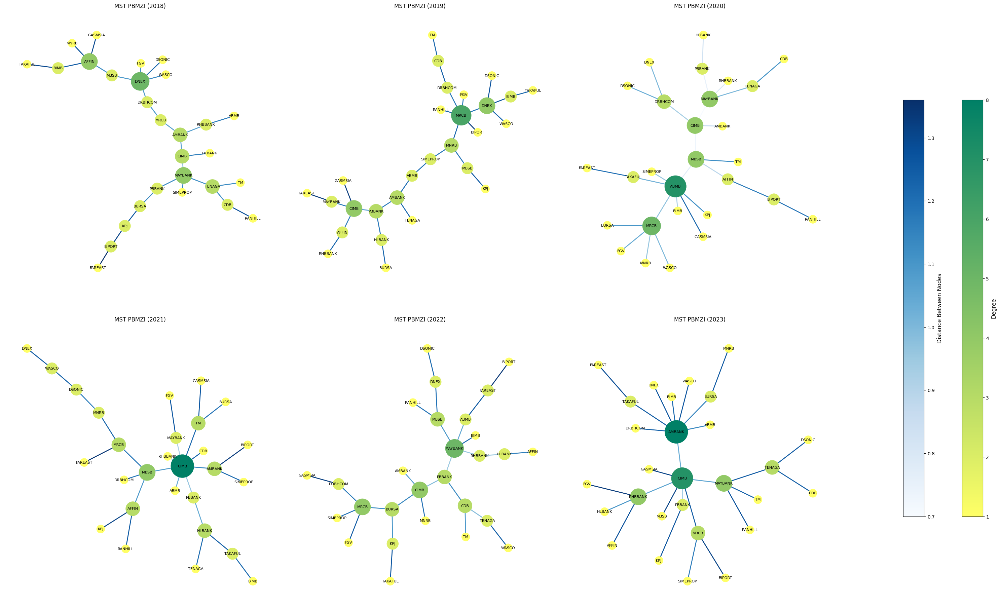

In [58]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import networkx as nx
import numpy as np
import pandas as pd

# === Senarai MST yang dah siap dikira ===
mst_dict = {
    "2018": MST_PBMZI_2018,
    "2019": MST_PBMZI_2019,
    "2020": MST_PBMZI_2020,
    "2021": MST_PBMZI_2021,
    "2022": MST_PBMZI_2022,
    "2023": MST_PBMZI_2023,
}

# Setup subplots (2x4 grid)
fig, axes = plt.subplots(2, 3, figsize=(30, 18), constrained_layout=True)
fig.set_constrained_layout_pads(hspace=0.08, wspace=0.02)
axes = axes.flatten()

# Colormaps (Matplotlib 3.7+ compatible)
node_cmap = plt.colormaps["summer_r"]
edge_cmap = plt.colormaps["Blues"]

# Simpan semua degree & weights untuk global normalization
all_degrees, all_weights = [], []
for G in mst_dict.values():
    all_degrees.extend([d for _, d in G.degree()])
    all_weights.extend(nx.get_edge_attributes(G, "weight").values())

# Normalization global
norm_node = mcolors.Normalize(vmin=min(all_degrees), vmax=max(all_degrees))
norm_edge = mcolors.Normalize(vmin=min(all_weights), vmax=max(all_weights))

# Plot setiap MST
for i, (title, G) in enumerate(mst_dict.items()):
    ax = axes[i]

    # Node size & color ikut degree
    degrees = dict(G.degree())
    values = np.array(list(degrees.values()))
    node_sizes = [v * 300 for v in values]
    node_colors = [node_cmap(norm_node(v)) for v in values]

    # Edge colors ikut weight (distance)
    weights = list(nx.get_edge_attributes(G, "weight").values())
    edge_colors = [edge_cmap(norm_edge(w)) for w in weights]

    # Layout (Kamada-Kawai supaya kurang overlap)
    pos = nx.kamada_kawai_layout(G, scale=5)

    # Draw edges (tanpa connectionstyle supaya tak warning)
    nx.draw_networkx_edges(G, pos, edge_color=edge_colors, width=2, ax=ax)

    # Draw nodes & labels
    nx.draw_networkx_nodes(G, pos, node_size=node_sizes,
                           node_color=node_colors, ax=ax)
    nx.draw_networkx_labels(G, pos, font_size=8, font_color="black", ax=ax)

    ax.set_title(f"MST PBMZI ({title})", fontsize=12)
    ax.axis("off")

# Kosongkan subplot lebih kalau ada
if len(mst_dict) < len(axes):
    for j in range(len(mst_dict), len(axes)):
        axes[j].axis("off")

# --- Tambah Global Colorbars ---
# Node degree colorbar
sm_nodes = plt.cm.ScalarMappable(cmap=node_cmap, norm=norm_node)
sm_nodes.set_array([])
cbar_nodes = fig.colorbar(sm_nodes, ax=axes, orientation="vertical",
                          fraction=0.025, pad=0.02)
cbar_nodes.set_label("Degree", fontsize=12)

# Edge distance colorbar
sm_edges = plt.cm.ScalarMappable(cmap=edge_cmap, norm=norm_edge)
sm_edges.set_array([])
cbar_edges = fig.colorbar(sm_edges, ax=axes, orientation="vertical",
                          fraction=0.025, pad=0.08)
cbar_edges.set_label("Distance Between Nodes", fontsize=12)

plt.show()

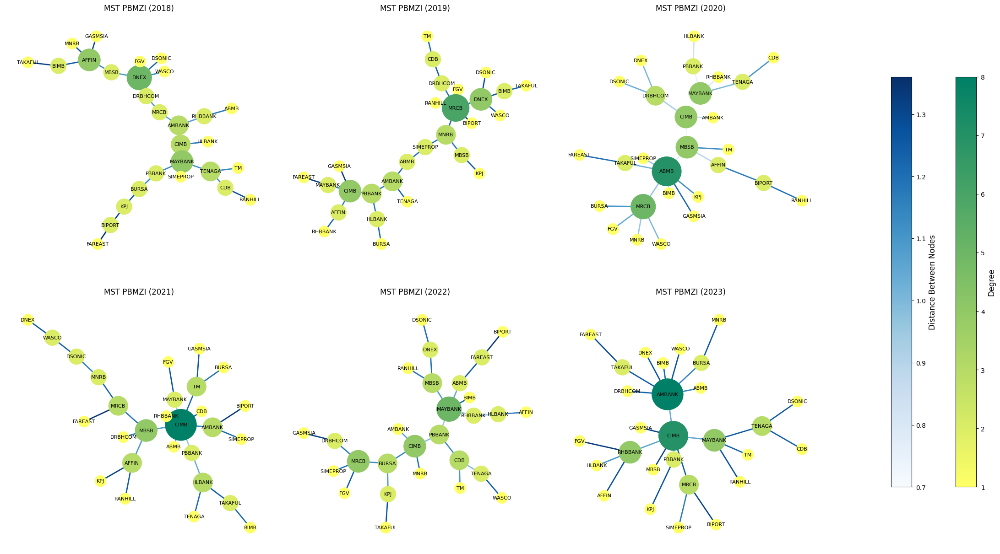

In [59]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import networkx as nx
import numpy as np
import pandas as pd

# === Senarai MST yang dah siap dikira ===
mst_dict = {
    "2018": MST_PBMZI_2018,
    "2019": MST_PBMZI_2019,
    "2020": MST_PBMZI_2020,
    "2021": MST_PBMZI_2021,
    "2022": MST_PBMZI_2022,
    "2023": MST_PBMZI_2023,
}

# Setup subplots (2x4 grid)
fig, axes = plt.subplots(2, 3, figsize=(22, 12), constrained_layout=True)
fig.set_constrained_layout_pads(hspace=0.08, wspace=0.02)
axes = axes.flatten()

# Colormaps (Matplotlib 3.7+ compatible)
node_cmap = plt.colormaps["summer_r"]
edge_cmap = plt.colormaps["Blues"]

# Simpan semua degree & weights untuk global normalization
all_degrees, all_weights = [], []
for G in mst_dict.values():
    all_degrees.extend([d for _, d in G.degree()])
    all_weights.extend(nx.get_edge_attributes(G, "weight").values())

# Normalization global
norm_node = mcolors.Normalize(vmin=min(all_degrees), vmax=max(all_degrees))
norm_edge = mcolors.Normalize(vmin=min(all_weights), vmax=max(all_weights))

# Plot setiap MST
for i, (title, G) in enumerate(mst_dict.items()):
    ax = axes[i]

    # Node size & color ikut degree
    degrees = dict(G.degree())
    values = np.array(list(degrees.values()))
    node_sizes = [v * 300 for v in values]
    node_colors = [node_cmap(norm_node(v)) for v in values]

    # Edge colors ikut weight (distance)
    weights = list(nx.get_edge_attributes(G, "weight").values())
    edge_colors = [edge_cmap(norm_edge(w)) for w in weights]

    # Layout (Kamada-Kawai supaya kurang overlap)
    pos = nx.kamada_kawai_layout(G)

    # Draw edges (tanpa connectionstyle supaya tak warning)
    nx.draw_networkx_edges(G, pos, edge_color=edge_colors, width=2, ax=ax)

    # Draw nodes & labels
    nx.draw_networkx_nodes(G, pos, node_size=node_sizes,
                           node_color=node_colors, ax=ax)
    nx.draw_networkx_labels(G, pos, font_size=8, font_color="black", ax=ax)

    ax.set_title(f"MST PBMZI ({title})", fontsize=12)
    ax.axis("off")

# Kosongkan subplot lebih kalau ada
if len(mst_dict) < len(axes):
    for j in range(len(mst_dict), len(axes)):
        axes[j].axis("off")

# --- Tambah Global Colorbars ---
# Node degree colorbar
sm_nodes = plt.cm.ScalarMappable(cmap=node_cmap, norm=norm_node)
sm_nodes.set_array([])
cbar_nodes = fig.colorbar(sm_nodes, ax=axes, orientation="vertical",
                          fraction=0.025, pad=0.02)
cbar_nodes.set_label("Degree", fontsize=12)

# Edge distance colorbar
sm_edges = plt.cm.ScalarMappable(cmap=edge_cmap, norm=norm_edge)
sm_edges.set_array([])
cbar_edges = fig.colorbar(sm_edges, ax=axes, orientation="vertical",
                          fraction=0.025, pad=0.08)
cbar_edges.set_label("Distance Between Nodes", fontsize=12)

plt.show()

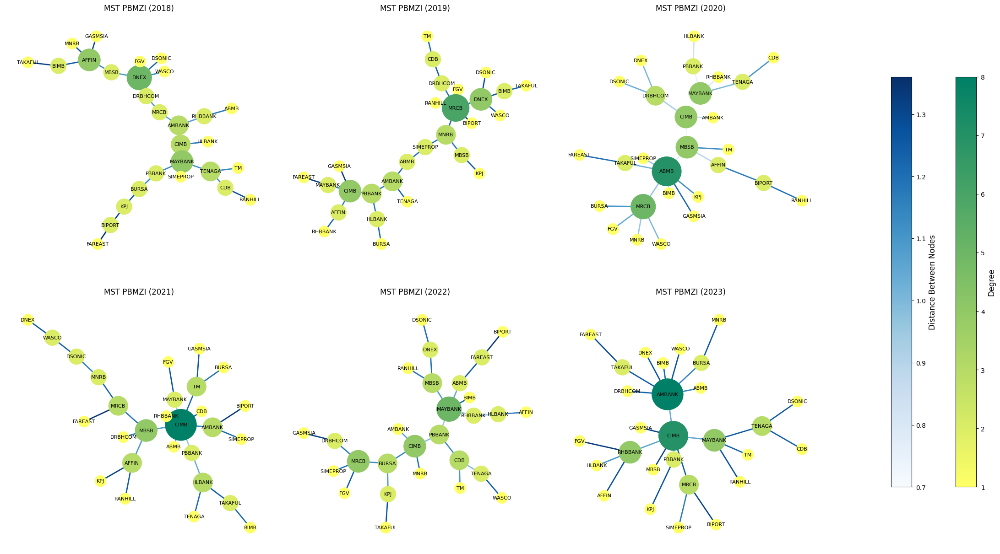

In [60]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import networkx as nx
import numpy as np
import pandas as pd

# === Senarai MST yang dah siap dikira ===
mst_dict = {
    "2018": MST_PBMZI_2018,
    "2019": MST_PBMZI_2019,
    "2020": MST_PBMZI_2020,
    "2021": MST_PBMZI_2021,
    "2022": MST_PBMZI_2022,
    "2023": MST_PBMZI_2023,
}

# Setup subplots (2x4 grid)
fig, axes = plt.subplots(2, 3, figsize=(22, 12), constrained_layout=True)
fig.set_constrained_layout_pads(hspace=0.08, wspace=0.02)
axes = axes.flatten()

# Colormaps (Matplotlib 3.7+ compatible)
node_cmap = plt.colormaps["summer_r"]
edge_cmap = plt.colormaps["Blues"]

# Simpan semua degree & weights untuk global normalization
all_degrees, all_weights = [], []
for G in mst_dict.values():
    all_degrees.extend([d for _, d in G.degree()])
    all_weights.extend(nx.get_edge_attributes(G, "weight").values())

# Normalization global
norm_node = mcolors.Normalize(vmin=min(all_degrees), vmax=max(all_degrees))
norm_edge = mcolors.Normalize(vmin=min(all_weights), vmax=max(all_weights))

# Plot setiap MST
for i, (title, G) in enumerate(mst_dict.items()):
    ax = axes[i]

    # Node size & color ikut degree
    degrees = dict(G.degree())
    values = np.array(list(degrees.values()))
    node_sizes = [v * 300 for v in values]
    node_colors = [node_cmap(norm_node(v)) for v in values]

    # Edge colors ikut weight (distance)
    weights = list(nx.get_edge_attributes(G, "weight").values())
    edge_colors = [edge_cmap(norm_edge(w)) for w in weights]

    # Layout (Kamada-Kawai supaya kurang overlap)
    pos = nx.kamada_kawai_layout(G, scale=2.0)

    # Draw edges (tanpa connectionstyle supaya tak warning)
    nx.draw_networkx_edges(G, pos, edge_color=edge_colors, width=2, ax=ax)

    # Draw nodes & labels
    nx.draw_networkx_nodes(G, pos, node_size=node_sizes,
                           node_color=node_colors, ax=ax)
    nx.draw_networkx_labels(G, pos, font_size=8, font_color="black", ax=ax)

    ax.set_title(f"MST PBMZI ({title})", fontsize=12)
    ax.axis("off")

# Kosongkan subplot lebih kalau ada
if len(mst_dict) < len(axes):
    for j in range(len(mst_dict), len(axes)):
        axes[j].axis("off")

# --- Tambah Global Colorbars ---
# Node degree colorbar
sm_nodes = plt.cm.ScalarMappable(cmap=node_cmap, norm=norm_node)
sm_nodes.set_array([])
cbar_nodes = fig.colorbar(sm_nodes, ax=axes, orientation="vertical",
                          fraction=0.025, pad=0.02)
cbar_nodes.set_label("Degree", fontsize=12)

# Edge distance colorbar
sm_edges = plt.cm.ScalarMappable(cmap=edge_cmap, norm=norm_edge)
sm_edges.set_array([])
cbar_edges = fig.colorbar(sm_edges, ax=axes, orientation="vertical",
                          fraction=0.025, pad=0.08)
cbar_edges.set_label("Distance Between Nodes", fontsize=12)

plt.show()

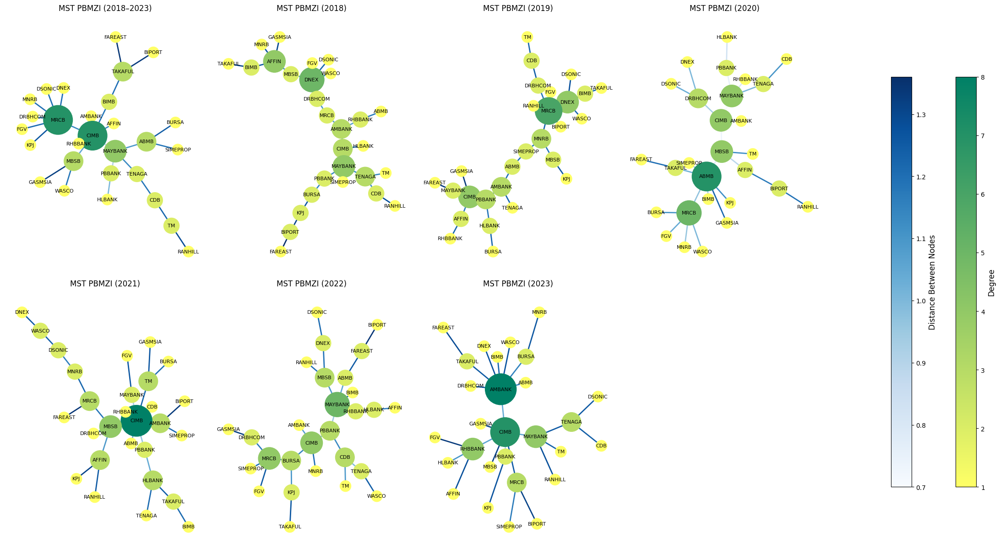

In [61]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import networkx as nx
import numpy as np
import pandas as pd

# === Senarai MST yang dah siap dikira ===
mst_dict = {
    "2018–2023": MST_PBMZI,
    "2018": MST_PBMZI_2018,
    "2019": MST_PBMZI_2019,
    "2020": MST_PBMZI_2020,
    "2021": MST_PBMZI_2021,
    "2022": MST_PBMZI_2022,
    "2023": MST_PBMZI_2023,
}

# Setup subplots (2x4 grid)
fig, axes = plt.subplots(2, 4, figsize=(22, 12), constrained_layout=True)
axes = axes.flatten()

# Colormaps (Matplotlib 3.7+ compatible)
node_cmap = plt.colormaps["summer_r"]
edge_cmap = plt.colormaps["Blues"]

# Simpan semua degree & weights untuk global normalization
all_degrees, all_weights = [], []
for G in mst_dict.values():
    all_degrees.extend([d for _, d in G.degree()])
    all_weights.extend(nx.get_edge_attributes(G, "weight").values())

# Normalization global
norm_node = mcolors.Normalize(vmin=min(all_degrees), vmax=max(all_degrees))
norm_edge = mcolors.Normalize(vmin=min(all_weights), vmax=max(all_weights))

# Plot setiap MST
for i, (title, G) in enumerate(mst_dict.items()):
    ax = axes[i]

    # Node size & color ikut degree
    degrees = dict(G.degree())
    values = np.array(list(degrees.values()))
    node_sizes = [v * 300 for v in values]
    node_colors = [node_cmap(norm_node(v)) for v in values]

    # Edge colors ikut weight (distance)
    weights = list(nx.get_edge_attributes(G, "weight").values())
    edge_colors = [edge_cmap(norm_edge(w)) for w in weights]

    # Layout (Kamada-Kawai supaya kurang overlap)
    pos = nx.kamada_kawai_layout(G)

    # Draw edges (tanpa connectionstyle supaya tak warning)
    nx.draw_networkx_edges(G, pos, edge_color=edge_colors, width=2, ax=ax)

    # Draw nodes & labels
    nx.draw_networkx_nodes(G, pos, node_size=node_sizes,
                           node_color=node_colors, ax=ax)
    nx.draw_networkx_labels(G, pos, font_size=8, font_color="black", ax=ax)

    ax.set_title(f"MST PBMZI ({title})", fontsize=12)
    ax.axis("off")

# Kosongkan subplot lebih kalau ada
if len(mst_dict) < len(axes):
    for j in range(len(mst_dict), len(axes)):
        axes[j].axis("off")

# --- Tambah Global Colorbars ---
# Node degree colorbar
sm_nodes = plt.cm.ScalarMappable(cmap=node_cmap, norm=norm_node)
sm_nodes.set_array([])
cbar_nodes = fig.colorbar(sm_nodes, ax=axes, orientation="vertical",
                          fraction=0.025, pad=0.02)
cbar_nodes.set_label("Degree", fontsize=12)

# Edge distance colorbar
sm_edges = plt.cm.ScalarMappable(cmap=edge_cmap, norm=norm_edge)
sm_edges.set_array([])
cbar_edges = fig.colorbar(sm_edges, ax=axes, orientation="vertical",
                          fraction=0.025, pad=0.08)
cbar_edges.set_label("Distance Between Nodes", fontsize=12)

plt.show()

In [62]:
len(axes)

8

/tmp/ipython-input-3352508923.py:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  node_cmap = cm.get_cmap("summer_r")
/tmp/ipython-input-3352508923.py:57: UserWarning: 

The connectionstyle keyword argument is not applicable when drawing edges
with LineCollection.

To make this warning go away, either specify `arrows=True` to
force FancyArrowPatches or use the default values.
Note that using FancyArrowPatches may be slow for large graphs.

  nx.draw_networkx_edges(G, pos, edge_color=edge_colors,
/tmp/ipython-input-3352508923.py:85: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])  # bagi ruang kanan untuk colorbar


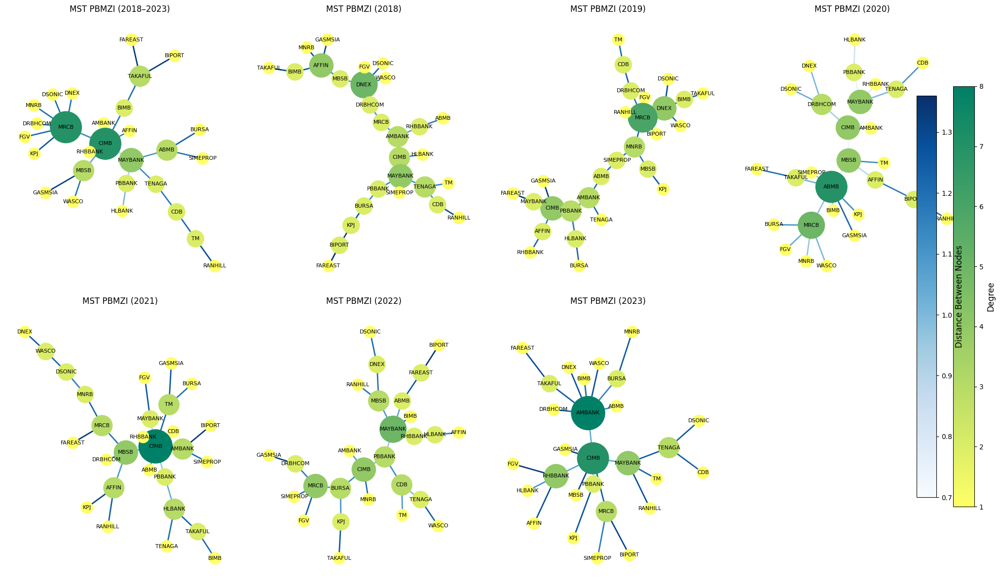

In [63]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import networkx as nx
import numpy as np
import pandas as pd

# Senarai MST dah siap dikira
mst_dict = {
    "2018–2023": MST_PBMZI,
    "2018": MST_PBMZI_2018,
    "2019": MST_PBMZI_2019,
    "2020": MST_PBMZI_2020,
    "2021": MST_PBMZI_2021,
    "2022": MST_PBMZI_2022,
    "2023": MST_PBMZI_2023,
}

# Setup subplots (2 baris x 4 kolum = 8 slot, guna 7)
fig, axes = plt.subplots(2, 4, figsize=(22, 12))
axes = axes.flatten()

# Colormaps untuk nodes & edges
node_cmap = cm.get_cmap("summer_r")
edge_cmap = cm.Blues

# Simpan semua degree & weights (untuk global normalization)
all_degrees = []
all_weights = []

for G in mst_dict.values():
    all_degrees.extend([d for n, d in G.degree()])
    all_weights.extend(nx.get_edge_attributes(G, "weight").values())

# Normalization global
norm_node = mcolors.Normalize(vmin=min(all_degrees), vmax=max(all_degrees))
norm_edge = mcolors.Normalize(vmin=min(all_weights), vmax=max(all_weights))

# Plot setiap MST
for i, (title, G) in enumerate(mst_dict.items()):
    ax = axes[i]

    # Node size & color ikut degree
    degrees = dict(G.degree())
    values = np.array(list(degrees.values()))
    node_sizes = [v * 300 for v in values]
    node_colors = [node_cmap(norm_node(v)) for v in values]

    # Edge colors ikut weight → transparency
    weights = list(nx.get_edge_attributes(G, "weight").values())
    edge_colors = [edge_cmap(norm_edge(w)) for w in weights]

    # Layout
    pos = nx.kamada_kawai_layout(G)

    # Draw edges
    nx.draw_networkx_edges(G, pos, edge_color=edge_colors,
                           width=2, connectionstyle="arc3,rad=0.2", ax=ax)
    # Draw nodes & labels
    nx.draw_networkx_nodes(G, pos, node_size=node_sizes,
                           node_color=node_colors, ax=ax)
    nx.draw_networkx_labels(G, pos, font_size=8, font_color="black", ax=ax)

    ax.set_title(f"MST PBMZI ({title})", fontsize=12)
    ax.axis("off")

# Kosongkan subplot lebih kalau ada
if len(mst_dict) < len(axes):
    for j in range(len(mst_dict), len(axes)):
        axes[j].axis("off")

# --- Add Global Colorbars ---
sm_nodes = cm.ScalarMappable(cmap=node_cmap, norm=norm_node)
sm_nodes.set_array([])
cbar_nodes = fig.colorbar(sm_nodes, ax=axes, orientation="vertical",
                          fraction=0.025, pad=0.02)
cbar_nodes.set_label("Degree", fontsize=12)

sm_edges = cm.ScalarMappable(cmap=edge_cmap, norm=norm_edge)
sm_edges.set_array([])
cbar_edges = fig.colorbar(sm_edges, ax=axes, orientation="vertical",
                          fraction=0.025, pad=0.12)
cbar_edges.set_label("Distance Between Nodes", fontsize=12)

plt.tight_layout(rect=[0, 0, 0.9, 1])  # bagi ruang kanan untuk colorbar
plt.show()


/tmp/ipython-input-3102394982.py:22: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  node_cmap = cm.get_cmap("summer_r")
/tmp/ipython-input-3102394982.py:44: UserWarning: 

The connectionstyle keyword argument is not applicable when drawing edges
with LineCollection.

To make this warning go away, either specify `arrows=True` to
force FancyArrowPatches or use the default values.
Note that using FancyArrowPatches may be slow for large graphs.

  nx.draw_networkx_edges(G, pos, edge_color=edge_colors,
/tmp/ipython-input-3102394982.py:81: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 1, 1, 1])  # beri ruang bawah utk legend
/tmp/ipython-input-3102394982.py:81: UserWarning: Tight layout not applied. The bottom and top margin

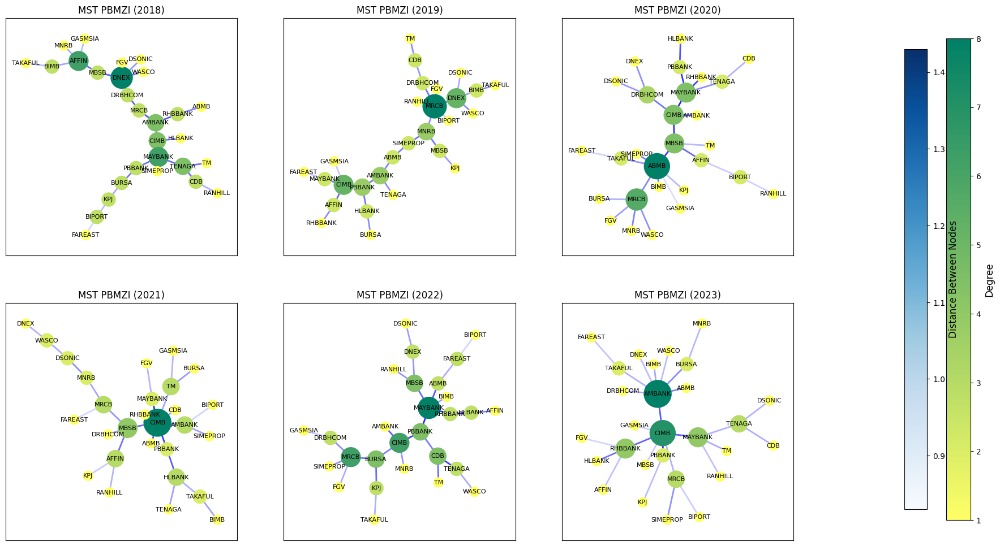

In [64]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import networkx as nx
from matplotlib.lines import Line2D

# Dictionary of all MSTs
mst_dict = {
    "2018": MST_PBMZI_2018,
    "2019": MST_PBMZI_2019,
    "2020": MST_PBMZI_2020,
    "2021": MST_PBMZI_2021,
    "2022": MST_PBMZI_2022,
    "2023": MST_PBMZI_2023,
}

# Setup subplots
fig, axes = plt.subplots(2, 3, figsize=(22, 12))
axes = axes.flatten()

# Colormaps for nodes & edges
node_cmap = cm.get_cmap("summer_r")
edge_cmap = cm.Blues

for i, (title, G) in enumerate(mst_dict.items()):
    ax = axes[i]

    # Node size & color by degree
    degrees = dict(G.degree())
    values = np.array(list(degrees.values()))
    node_sizes = [v * 150 for v in values]
    norm_node = mcolors.Normalize(vmin=values.min(), vmax=values.max())
    node_colors = [node_cmap(norm_node(v)) for v in values]

    # Edge transparency by weight
    weights = list(nx.get_edge_attributes(G, "weight").values())
    norm_edge = mcolors.Normalize(vmin=min(weights)-0.1, vmax=max(weights)+0.1)
    edge_colors = [(0, 0, 1, 1 - norm_edge(w)) for w in weights]

    # Layout
    pos = nx.kamada_kawai_layout(G)

    # Draw edges
    nx.draw_networkx_edges(G, pos, edge_color=edge_colors,
                           width=2, connectionstyle="arc3,rad=0.2", ax=ax)
    # Draw nodes & labels
    nx.draw_networkx_nodes(G, pos, node_size=node_sizes,
                           node_color=node_colors, ax=ax)
    nx.draw_networkx_labels(G, pos, font_size=8, font_color="black", ax=ax)

    ax.set_title(f"MST PBMZI ({title})", fontsize=12)

# Kosongkan subplot lebih kalau ada
if len(mst_dict) < len(axes):
    for j in range(len(mst_dict), len(axes)):
        axes[j].axis("off")

# --- Custom Legend (single) ---
#legend_elements = [
#    Line2D([0], [0], marker='o', color='w', label='Node color = Degree (Connections)',
#           markerfacecolor=node_cmap(0.9), markersize=12),
#    Line2D([0], [0], color='blue', lw=2, alpha=1.0, label='Edge opacity = Strong link (low distance)'),
#    Line2D([0], [0], color='blue', lw=2, alpha=0.2, label='Edge opacity = Weak link (high distance)')
#]
# --- Add Global Colorbars ---
sm_nodes = cm.ScalarMappable(cmap=node_cmap, norm=norm_node)
sm_nodes.set_array([])
cbar_nodes = fig.colorbar(sm_nodes, ax=axes, orientation="vertical",
                          fraction=0.025, pad=0.02)
cbar_nodes.set_label("Degree", fontsize=12)

sm_edges = cm.ScalarMappable(cmap=edge_cmap, norm=norm_edge)
sm_edges.set_array([])
cbar_edges = fig.colorbar(sm_edges, ax=axes, orientation="vertical",
                          fraction=0.025, pad=0.12)
cbar_edges.set_label("Distance Between Nodes", fontsize=12)

#plt.tight_layout(rect=[0, 0, 0.9, 1])  # bagi ruang kanan untuk colorbar
#plt.show()

plt.tight_layout(rect=[0, 1, 1, 1])  # beri ruang bawah utk legend
plt.show()


/tmp/ipython-input-2614868092.py:22: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_nodes = cm.get_cmap("summer_r")
/tmp/ipython-input-2614868092.py:35: UserWarning: 

The connectionstyle keyword argument is not applicable when drawing edges
with LineCollection.

To make this warning go away, either specify `arrows=True` to
force FancyArrowPatches or use the default values.
Note that using FancyArrowPatches may be slow for large graphs.

  nx.draw_networkx_edges(G, pos, edge_color=edge_colors, width=2,


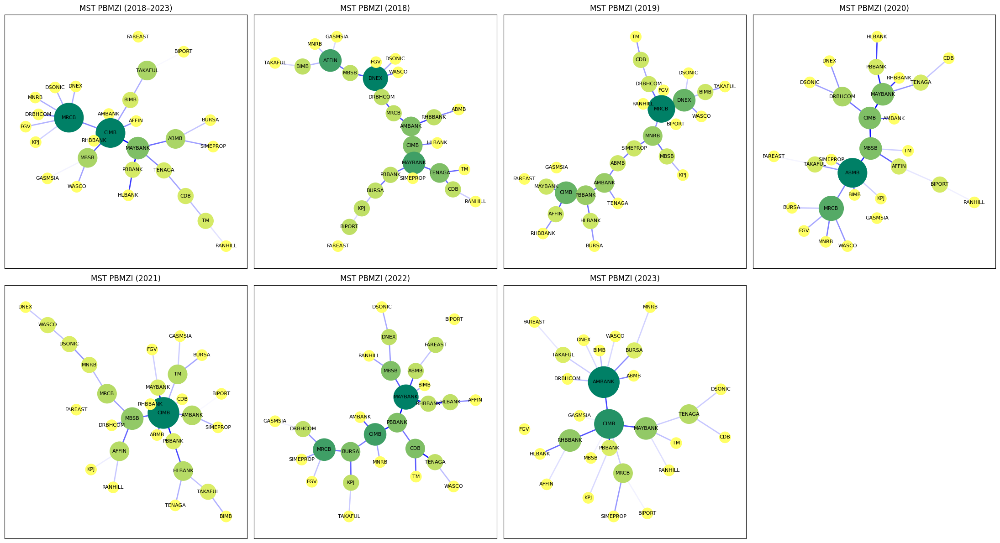

In [65]:
# Senarai graph dan tajuk
graphs = [
    ("2018–2023", MST_PBMZI),
    ("2018", MST_PBMZI_2018),
    ("2019", MST_PBMZI_2019),
    ("2020", MST_PBMZI_2020),
    ("2021", MST_PBMZI_2021),
    ("2022", MST_PBMZI_2022),
    ("2023", MST_PBMZI_2023),
]

# Buat subplot grid (2 baris x 4 kolum = 7 plot)
fig, axes = plt.subplots(2, 4, figsize=(22, 12))
axes = axes.flatten()


for ax, (title, G) in zip(axes, graphs):
    # Node colors ikut degree
    node_values = dict(G.degree())
    values = np.array(list(node_values.values()))
    norm_nodes = mcolors.Normalize(vmin=min(values), vmax=max(values))
    cmap_nodes = cm.get_cmap("summer_r")
    node_colors = [cmap_nodes(norm_nodes(val)) for val in values]
    node_sizes = [v * 300 for v in values]

    # Edge colors ikut weight → transparency
    weights = list(nx.get_edge_attributes(G, "weight").values())
    norm_edges = mcolors.Normalize(vmin=min(weights), vmax=max(weights))
    edge_colors = [(0, 0, 1, 1 - norm_edges(w)) for w in weights]

    # Layout → Kamada-Kawai (kurang overlap)
    pos = nx.kamada_kawai_layout(G)

    # Draw MST
    nx.draw_networkx_edges(G, pos, edge_color=edge_colors, width=2,
                           connectionstyle="arc3,rad=0.2", ax=ax)
    nx.draw_networkx_nodes(G, pos, node_color=node_colors,
                           node_size=node_sizes, ax=ax)
    nx.draw_networkx_labels(G, pos, font_size=8, font_color="black", ax=ax)

    ax.set_title(f"MST PBMZI ({title})")

# Buang axis kosong kalau subplot > jumlah graph
for j in range(len(graphs), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

#7. Betweenness Centrality

In [66]:
import pandas as pd
import networkx as nx

# List of MST graphs with their respective labels
mst_dict = {
    '2018-2023': MST_PBMZI,
    '2018': MST_PBMZI_2018,
    '2019': MST_PBMZI_2019,
    '2020': MST_PBMZI_2020,
    '2021': MST_PBMZI_2021,
    '2022': MST_PBMZI_2022,
    '2023': MST_PBMZI_2023,
}

# Dictionary to store betweenness centrality data for each graph
centrality_data = {}

# Loop through each graph and calculate betweenness centrality
for year, graph in mst_dict.items():
    centrality = nx.betweenness_centrality(graph, weight='weight', normalized=True)
    centrality_data[year] = centrality

# Get a set of all unique companies across all MSTs
all_companies = set()
for centrality in centrality_data.values():
    all_companies.update(centrality.keys())

# Create a DataFrame with all companies and fill in the centralities
centrality_df = pd.DataFrame(index=sorted(all_companies))

# Fill the DataFrame with each year's centrality data
for year in mst_dict.keys():
    centrality_df[year] = centrality_data[year]

# Replace missing values with 0 (if a company is not in that year's MST)
centrality_df = centrality_df.fillna(0)

# Reset index to bring 'Company' as a column
centrality_df.reset_index(inplace=True)
centrality_df.rename(columns={'index': 'Company'}, inplace=True)

# Display as a table
centrality_df

,Company,2018-2023,2018,2019,2020,2021,2022,2023
0,ABMB,0.145299,0.000000,0.501425,0.626781,0.000000,0.142450,0.000000
1,AFFIN,0.000000,0.276353,0.074074,0.142450,0.145299,0.000000,0.000000
2,AMBANK,0.000000,0.586895,0.509972,0.000000,0.145299,0.000000,0.558405
3,BIMB,0.205128,0.074074,0.074074,0.000000,0.000000,0.000000,0.000000
4,BIPORT,0.000000,0.074074,0.000000,0.074074,0.000000,0.000000,0.000000
5,BURSA,0.000000,0.205128,0.000000,0.000000,0.000000,0.427350,0.074074
6,CDB,0.142450,0.074074,0.074074,0.000000,0.000000,0.210826,0.000000
7,CIMB,0.786325,0.544160,0.336182,0.561254,0.794872,0.532764,0.800570
8,DNEX,0.000000,0.521368,0.276353,0.000000,0.000000,0.074074,0.000000
9,DRBHCOM,0.000000,0.484330,0.142450,0.145299,0.000000,0.074074,0.000000


In [67]:
centrality_df.to_excel("centrality.xlsx", index=False)